In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import csv 
import seaborn as sns
import plotly.express as px
import plotly.io as pio
from scipy.stats import pearsonr
import statsmodels

### Data

##### Input data

In [2]:
file1 = "E:/NhiAri/Code/DataScience/mid_final/thai-binh-2002-2022.csv"
weather = pd.read_csv(file1)

weather.head()

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
0,thai binh,1/31/2002,17.3,14.6,15.7,17.3,14.6,15.7,13.0,84.3,...,NaN,NaN,NaN,2002-01-31T06:31:16,2002-01-31T17:44:59,0.58,"Rain, Overcast",Cloudy skies throughout the day with late afte...,rain,"4,882,309,999,948,820,000,000"
1,thai binh,2/1/2002,14.9,11.6,12.7,14.9,11.6,12.7,11.3,91.5,...,NaN,NaN,NaN,2002-02-01T06:30:58,2002-02-01T17:45:35,0.61,"Rain, Overcast",Cloudy skies throughout the day with a chance ...,rain,"4,882,309,999,948,820,000,000"
2,thai binh,2/2/2002,12.6,11.4,12.0,12.6,11.4,12.0,8.4,78.7,...,NaN,NaN,NaN,2002-02-02T06:30:38,2002-02-02T17:46:11,0.65,"Rain, Overcast",Cloudy skies throughout the day with rain.,rain,"4,882,309,999,948,820,000,000"
3,thai binh,2/3/2002,15.3,11.5,13.3,15.3,11.5,13.3,10.9,85.9,...,NaN,NaN,NaN,2002-02-03T06:30:17,2002-02-03T17:46:47,0.68,"Rain, Overcast",Cloudy skies throughout the day with afternoon...,rain,"4,882,309,999,948,820,000,000"
4,thai binh,2/4/2002,15.5,13.5,14.2,15.5,13.5,14.2,13.8,97.7,...,NaN,NaN,NaN,2002-02-04T06:29:55,2002-02-04T17:47:22,0.75,"Rain, Overcast",Cloudy skies throughout the day with rain.,rain,"4,882,309,999,948,820,000,000"


In [3]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7640 entries, 0 to 7639
Data columns (total 33 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              7640 non-null   object 
 1   datetime          7640 non-null   object 
 2   tempmax           7632 non-null   float64
 3   tempmin           7632 non-null   float64
 4   temp              7632 non-null   float64
 5   feelslikemax      7632 non-null   float64
 6   feelslikemin      7632 non-null   float64
 7   feelslike         7632 non-null   float64
 8   dew               7632 non-null   float64
 9   humidity          7632 non-null   float64
 10  precip            7632 non-null   float64
 11  precipprob        7632 non-null   float64
 12  precipcover       7640 non-null   float64
 13  preciptype        4517 non-null   object 
 14  snow              4018 non-null   float64
 15  snowdepth         4018 non-null   float64
 16  windgust          4018 non-null   float64


In [20]:
weather['solarenergy'].describe()

count    7640.000000
mean       14.934499
std         4.744007
min         0.000000
25%        13.100000
50%        14.934499
75%        16.700000
max        28.500000
Name: solarenergy, dtype: float64

In [4]:
file2 = "E:/NhiAri/Code/DataScience/mid_final/ThaiBinh.csv"
crop = pd.read_csv(file2)

crop.head(5)

,Năm,Năng suất cả năm,Sản lượng cả năm,Năng suất vụ đông xuân,Sản lượng vụ đông xuân,Năng suất vụ mùa,Sản lượng vụ mùa,Unit_Năng_suất,Unit_Sản_lượng
0,2002,63.0,1081.6,67.4,574.1,58.6,507.5,Tạ/ha,Nghìn tấn
1,2003,54.6,930.7,69.2,585.8,40.2,344.9,Tạ/ha,Nghìn tấn
2,2004,63.4,1069.5,70.2,585.4,56.8,484.1,Tạ/ha,Nghìn tấn
3,2005,58.6,981.6,71.1,590.1,46.4,391.5,Tạ/ha,Nghìn tấn
4,2006,65.0,1079.6,71.1,584.1,59.1,495.5,Tạ/ha,Nghìn tấn


In [5]:
crop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Năm                     21 non-null     int64  
 1   Năng suất cả năm        21 non-null     float64
 2   Sản lượng cả năm        21 non-null     float64
 3   Năng suất vụ đông xuân  21 non-null     float64
 4   Sản lượng vụ đông xuân  21 non-null     float64
 5   Năng suất vụ mùa        21 non-null     float64
 6   Sản lượng vụ mùa        21 non-null     float64
 7   Unit_Năng_suất          21 non-null     object 
 8   Unit_Sản_lượng          21 non-null     object 
dtypes: float64(6), int64(1), object(2)
memory usage: 1.6+ KB


##### Preprocessing data

In [6]:
weather['datetime']=pd.to_datetime(weather['datetime'])
weather['year']=weather['datetime'].dt.year
weather['month'] = weather['datetime'].dt.month
weather['day'] = weather['datetime'].dt.day
weather['day_of_year'] = weather['datetime'].dt.dayofyear


In [7]:
weather.sort_values(by='datetime', inplace=True)

### Plot

#### heatmap

##### all year

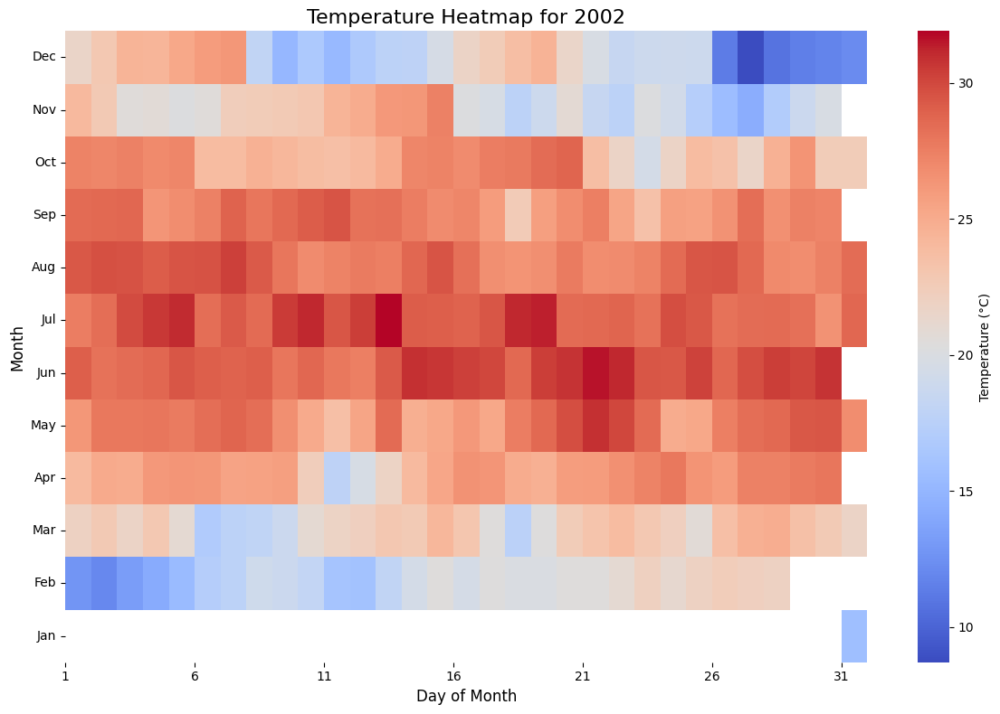

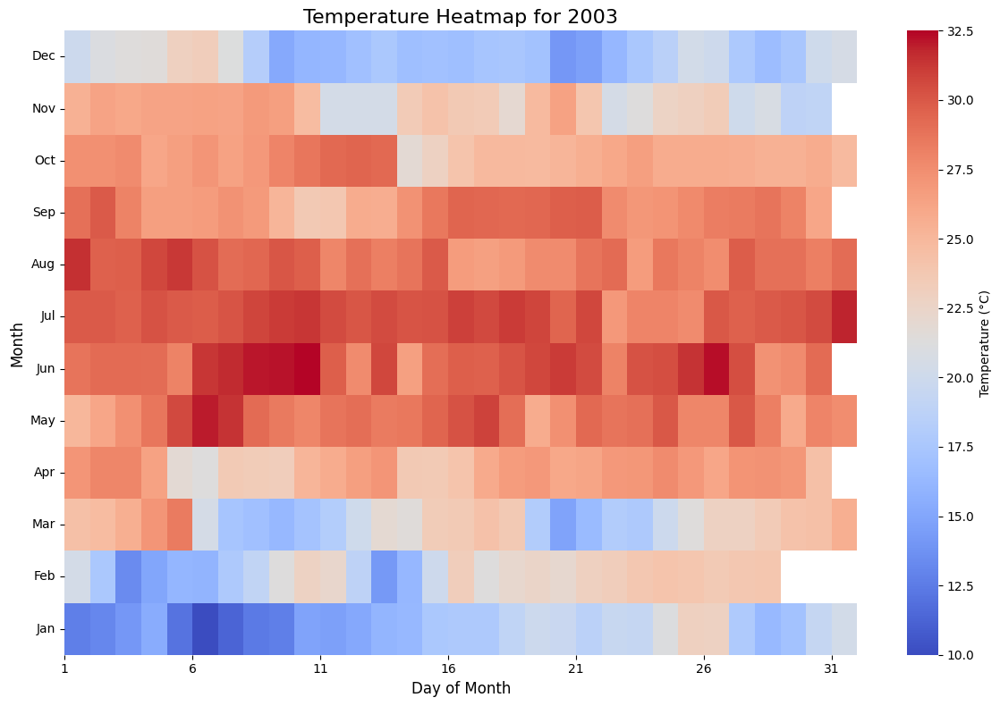

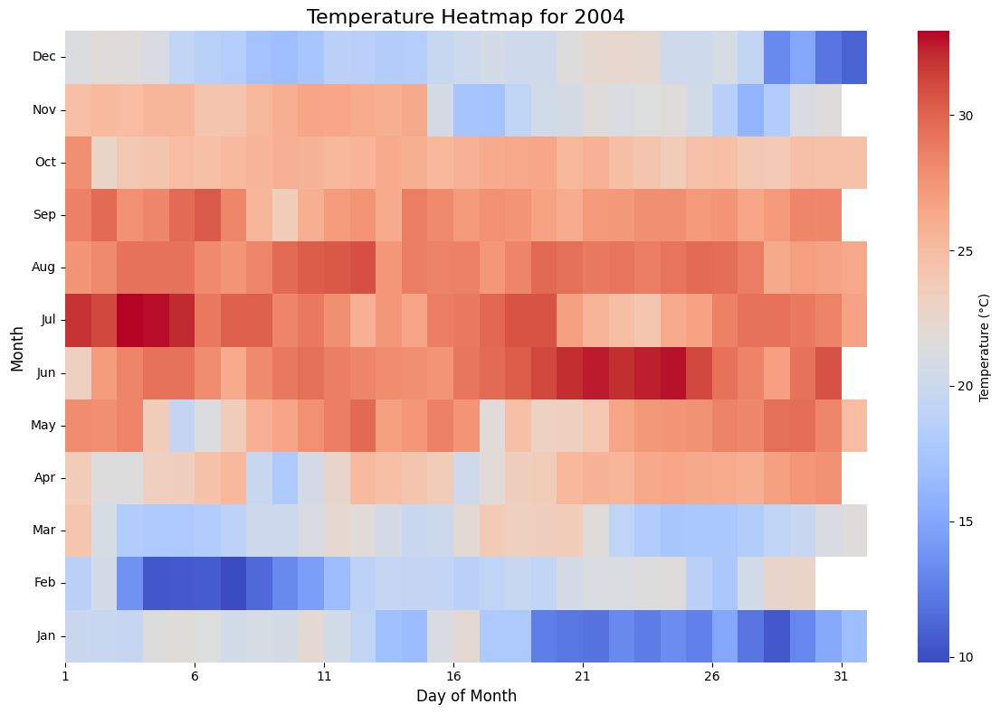

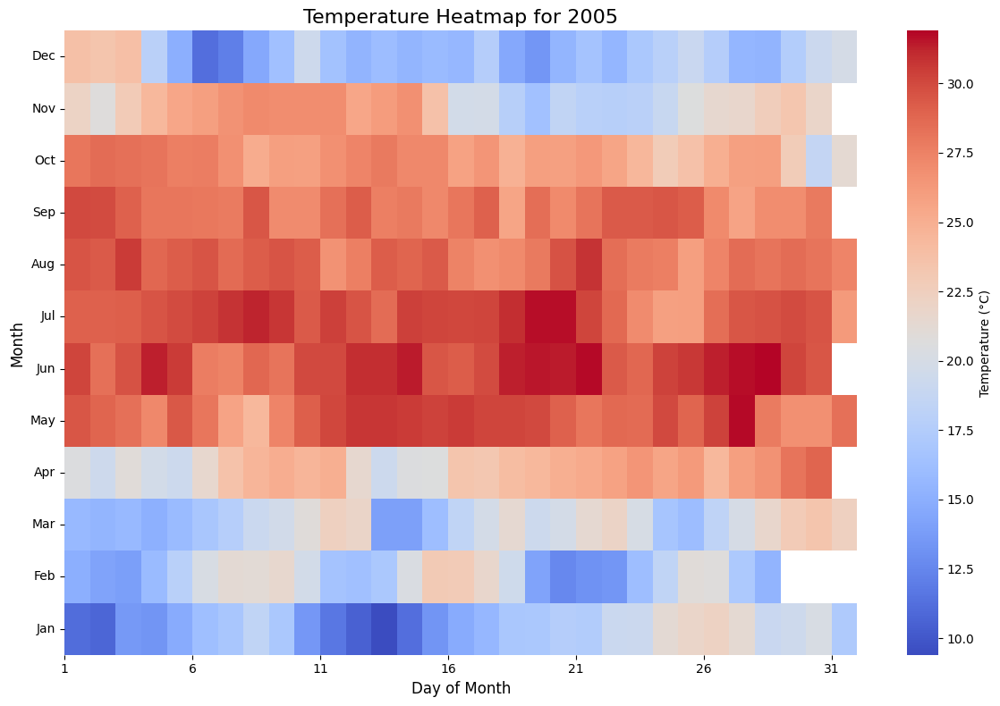

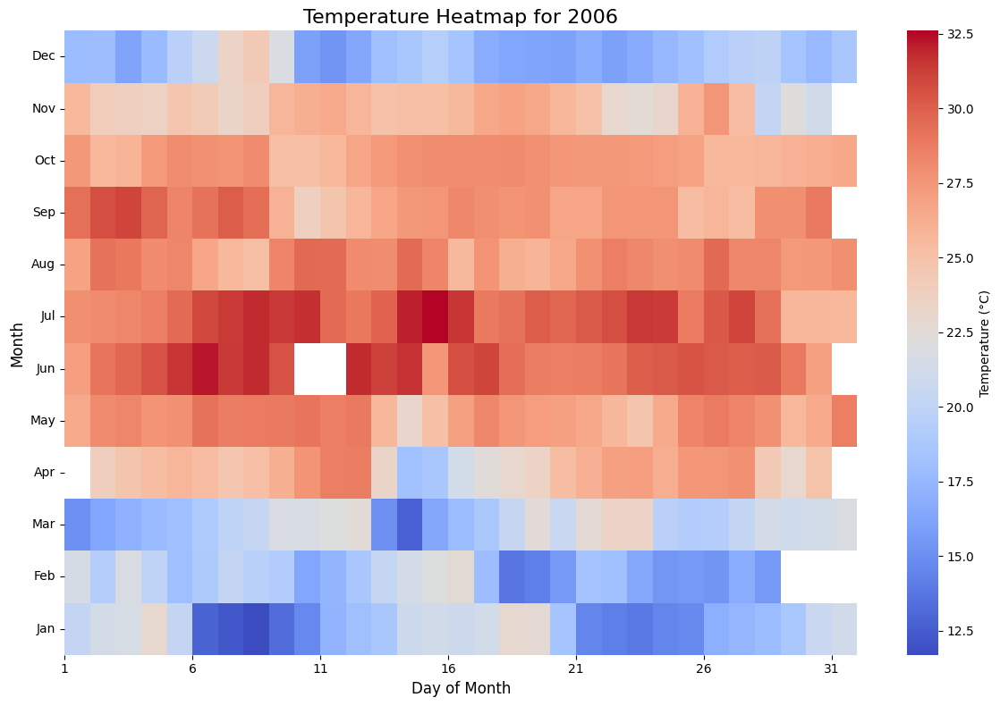

...

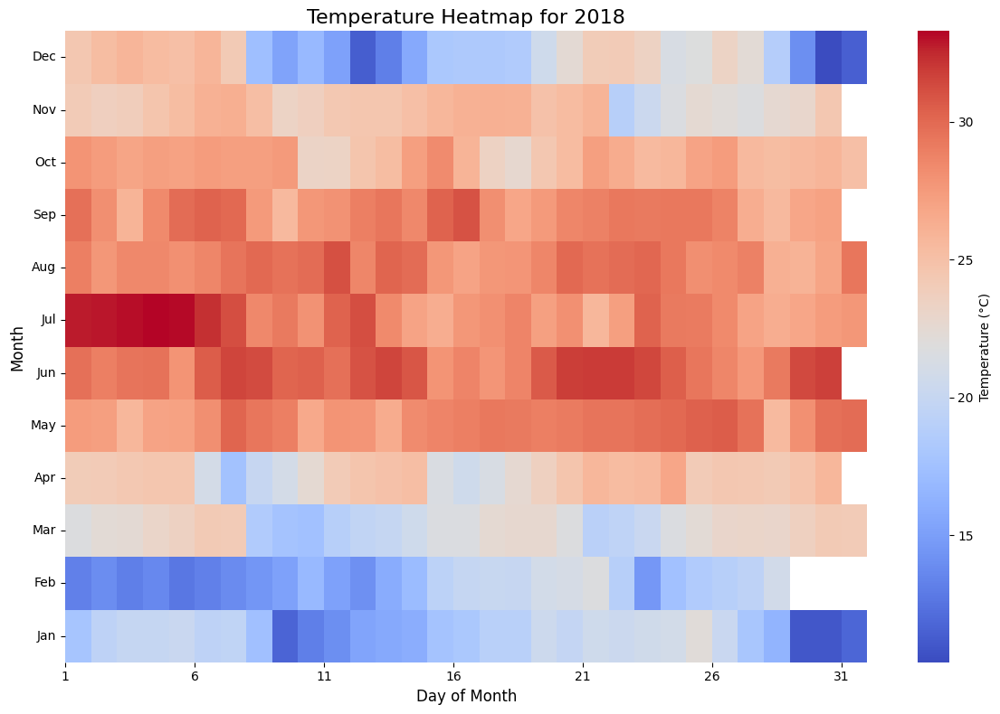

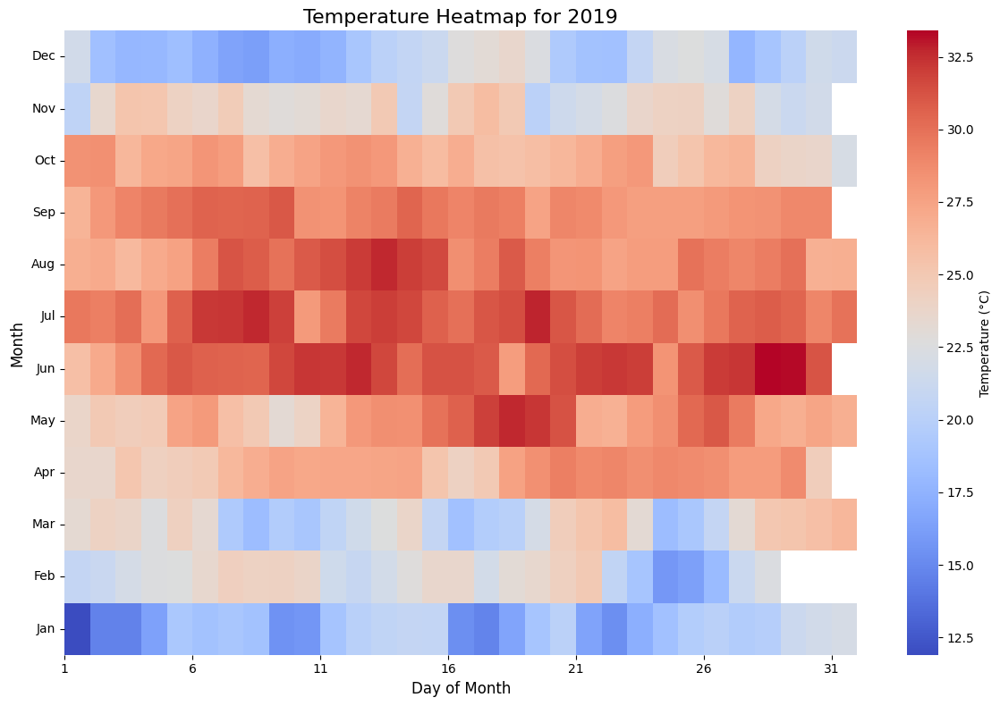

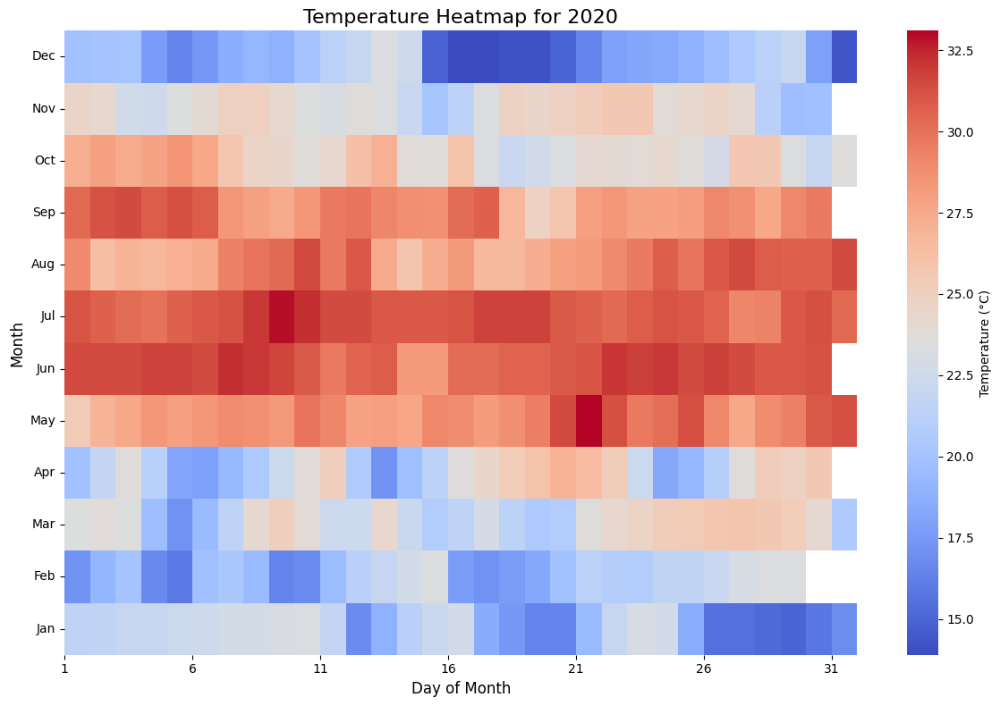

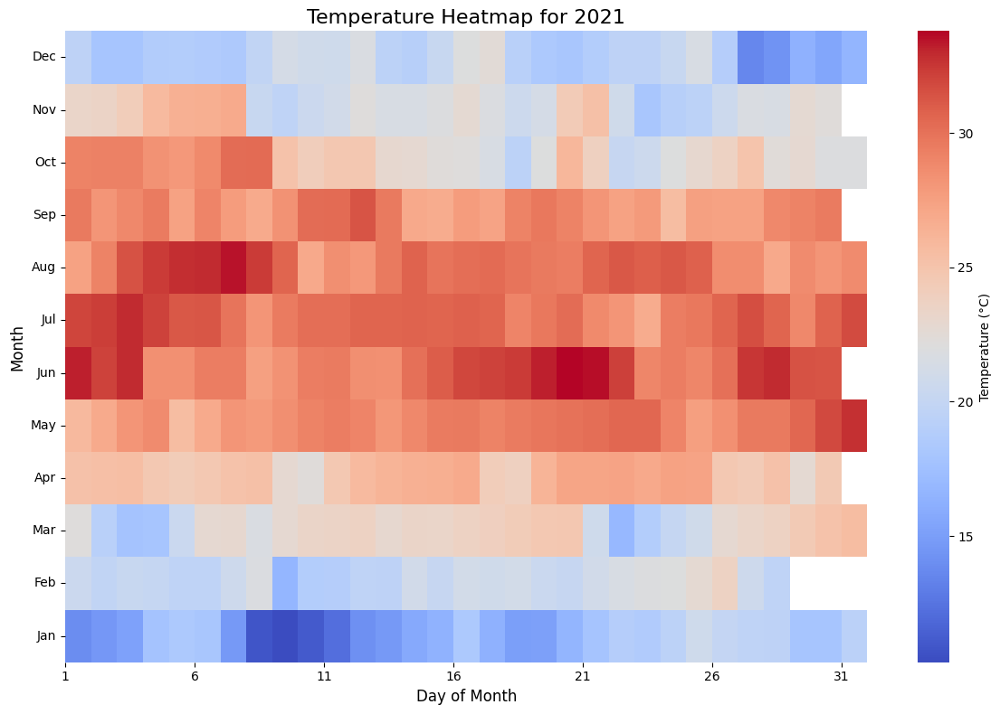

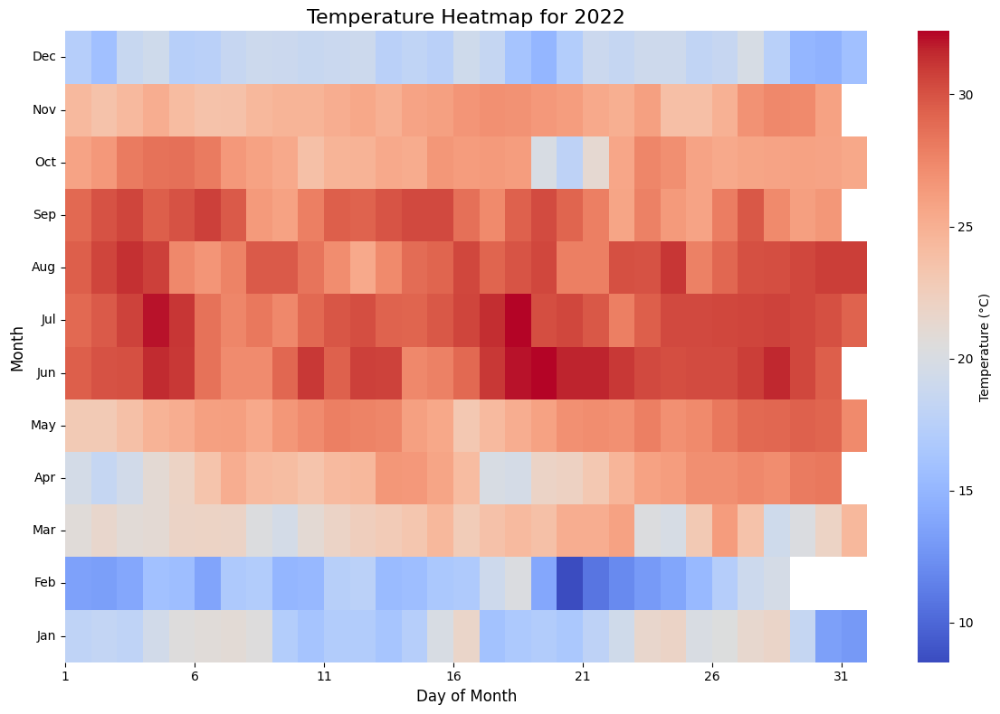

In [10]:
years = weather['year'].unique()

for year in years:
    # Filter data for the specific year
    weather_year = weather[weather['year'] == year]
    
    # Pivot the data to have 'day' as columns and 'month' as index
    heatmap_data = weather_year.pivot(index='month', columns='day', values='temp')
    
    # Reverse the order of months to have January at the top
    heatmap_data = heatmap_data.iloc[::-1]

    # Create the plot
    plt.figure(figsize=(12, 8))
    ax = sns.heatmap(heatmap_data, cmap='coolwarm', annot=False, fmt='.1f', 
                     cbar_kws={'label': 'Temperature (°C)'})
    
    # Customize the plot
    plt.title(f'Temperature Heatmap for {year}', fontsize=16)
    plt.xlabel('Day of Month', fontsize=12)
    plt.ylabel('Month', fontsize=12)
    
    # Adjust y-axis ticks to show month names
    month_names = ['Dec', 'Nov', 'Oct', 'Sep', 'Aug', 'Jul', 'Jun', 'May', 'Apr', 'Mar', 'Feb', 'Jan']
    ax.set_yticklabels(month_names, rotation=0)
    
    # Adjust x-axis ticks
    ax.set_xticks(range(0, 31, 5))
    ax.set_xticklabels(range(1, 32, 5))
    
    # Add colorbar label
    cbar = ax.collections[0].colorbar
    cbar.set_label('Temperature (°C)', fontsize=10)
    
    plt.tight_layout()
    plt.show()

##### jan_may and may_sep

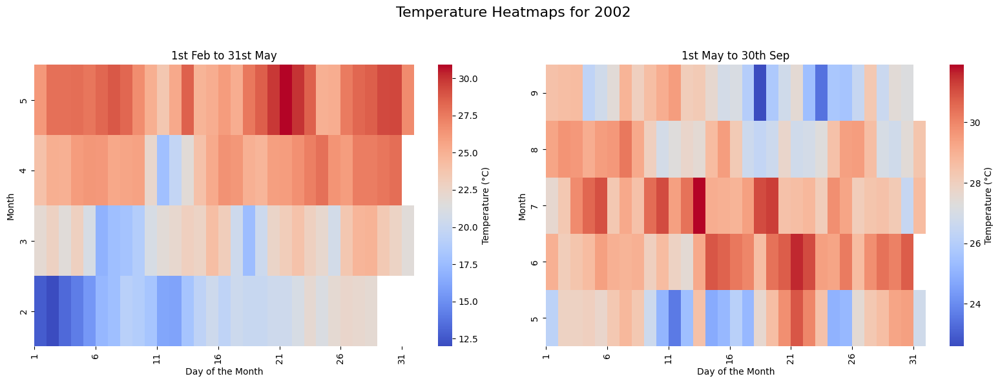

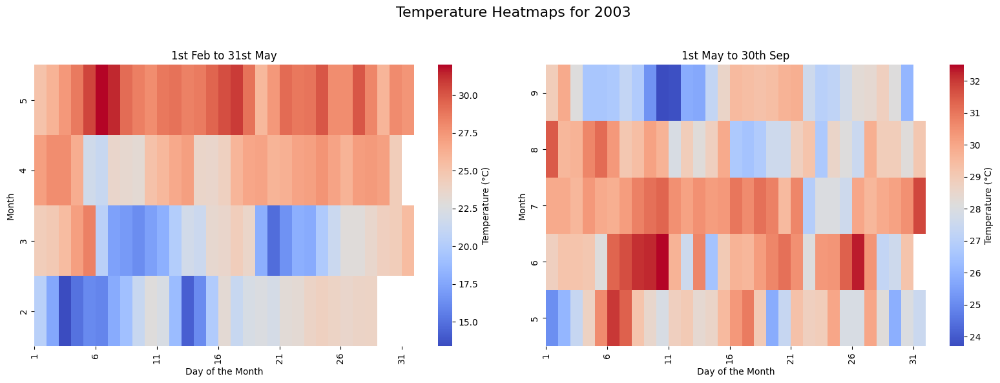

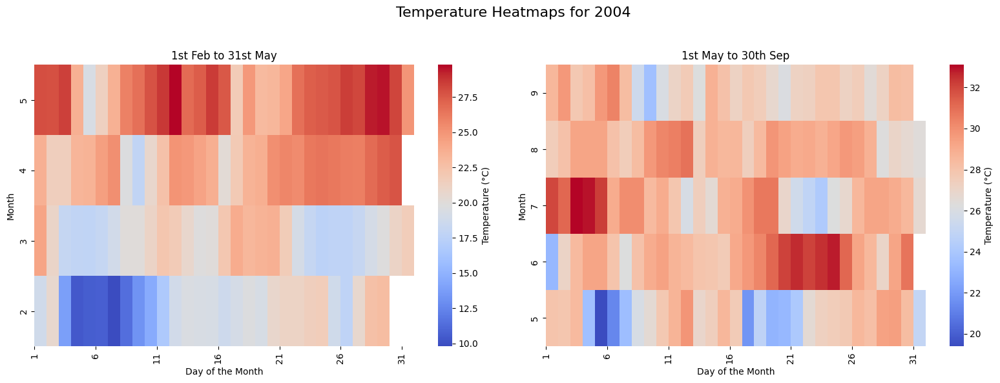

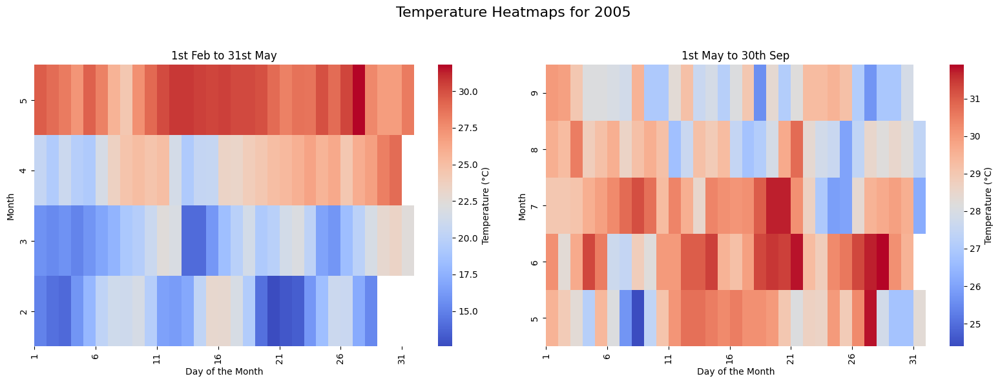

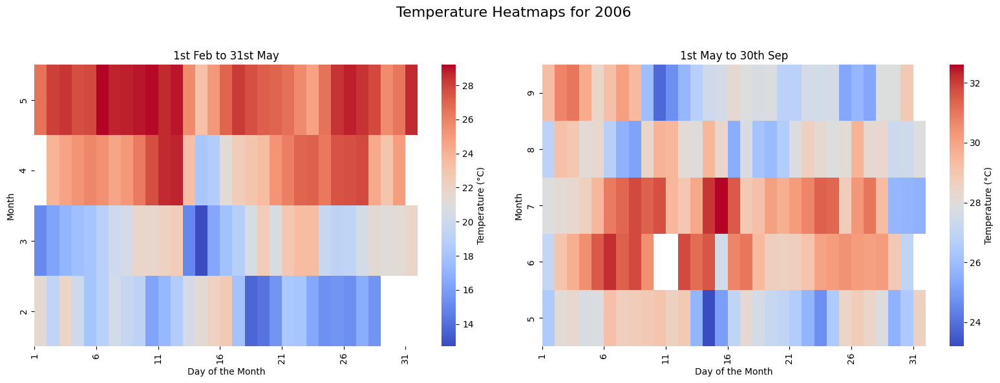

...

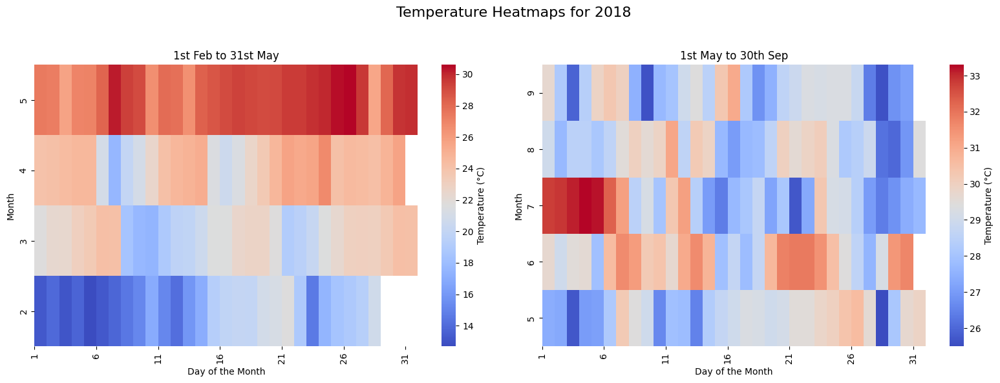

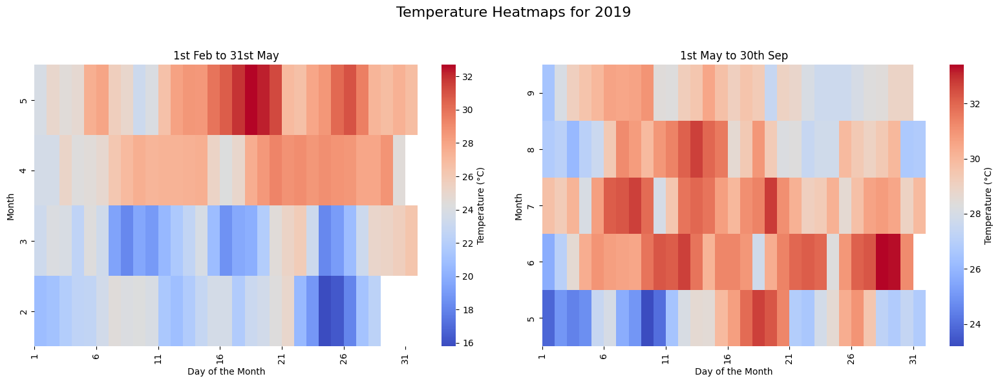

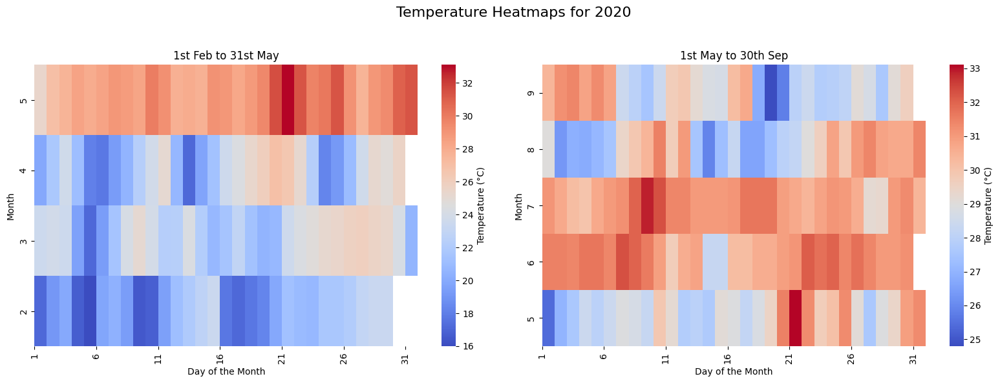

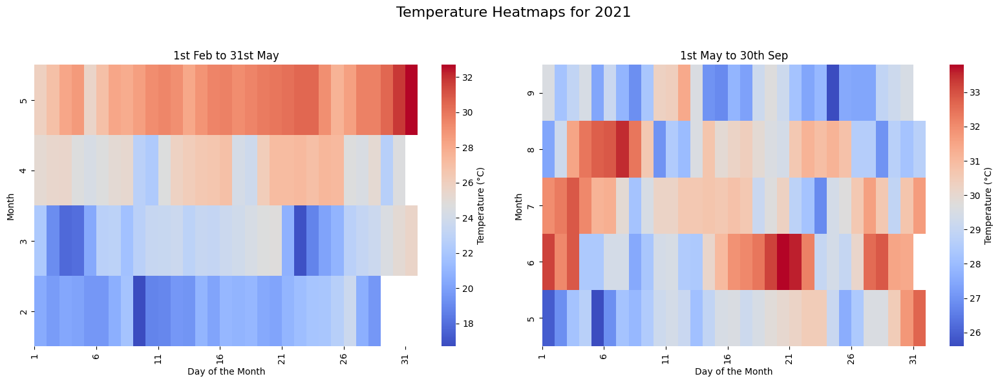

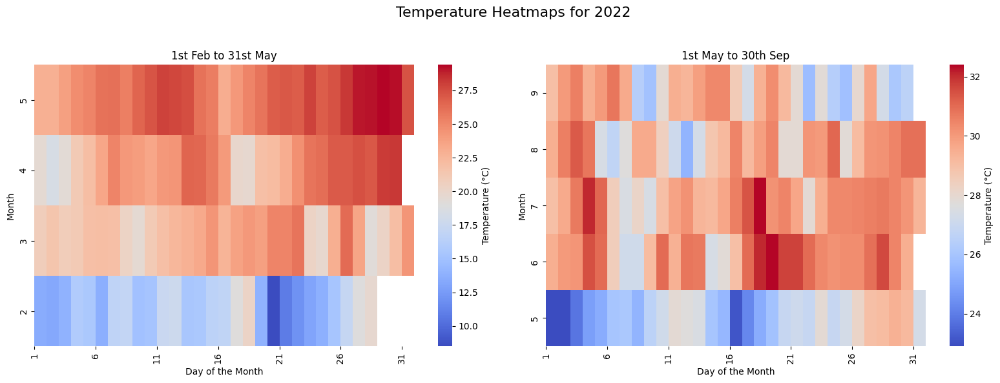

In [19]:
years = weather['year'].unique()

for year in years:
    # Filter the data for February to May
    feb_may = weather[(weather['year'] == year) & 
                      (weather['datetime'] >= f'{year}-02-01') & 
                      (weather['datetime'] <= f'{year}-05-31')]

    # Filter the data for May to September
    may_sep = weather[(weather['year'] == year) & 
                      (weather['datetime'] >= f'{year}-05-01') & 
                      (weather['datetime'] <= f'{year}-09-30')]
    
    # Create pivot tables with day as x and month as y
    feb_may_pivot = feb_may.pivot_table(index='month', 
                                        columns=feb_may['day'], 
                                        values='temp', 
                                        aggfunc='mean')
    feb_may_pivot = feb_may_pivot.iloc[::-1]

    may_sep_pivot = may_sep.pivot_table(index='month', 
                                        columns=may_sep['day'], 
                                        values='temp', 
                                        aggfunc='mean')
    may_sep_pivot = may_sep_pivot.iloc[::-1]

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Temperature Heatmaps for {year}', fontsize=16)
    
    # Heatmap for February to May
    sns.heatmap(feb_may_pivot, cmap='coolwarm', annot=False, fmt=".1f", cbar_kws={'label': 'Temperature (°C)'}, ax=ax1)
    ax1.set_title('1st Feb to 31st May')
    ax1.set_xlabel('Day of the Month')
    ax1.set_ylabel('Month')
    ax1.set_xticks(range(0, 31, 5))
    ax1.set_xticklabels(range(1, 32, 5))

    # Heatmap for May to September
    sns.heatmap(may_sep_pivot, cmap='coolwarm', annot=False, fmt=".1f", cbar_kws={'label': 'Temperature (°C)'}, ax=ax2)
    ax2.set_title('1st May to 30th Sep')
    ax2.set_xlabel('Day of the Month')
    ax2.set_ylabel('Month')
    ax2.set_xticks(range(0, 31, 5))
    ax2.set_xticklabels(range(1, 32, 5))
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the title
    plt.show()


#### linemap

##### weather

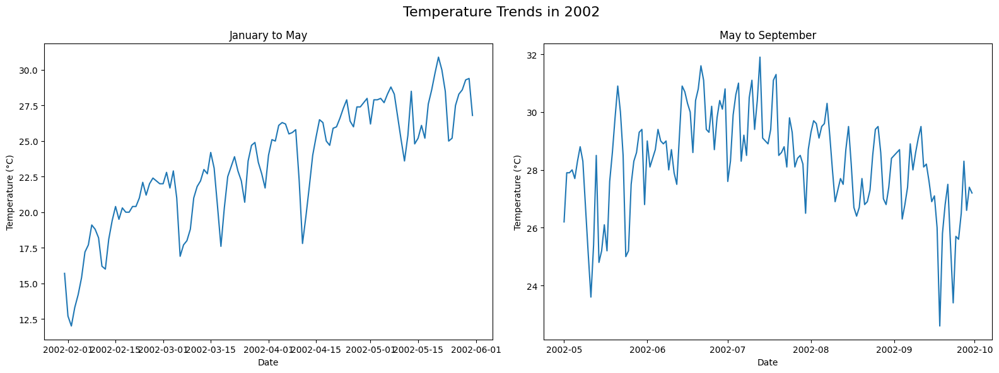

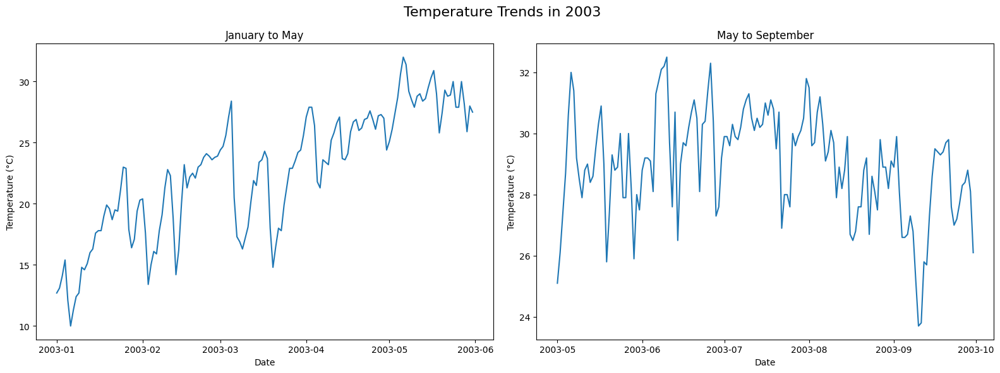

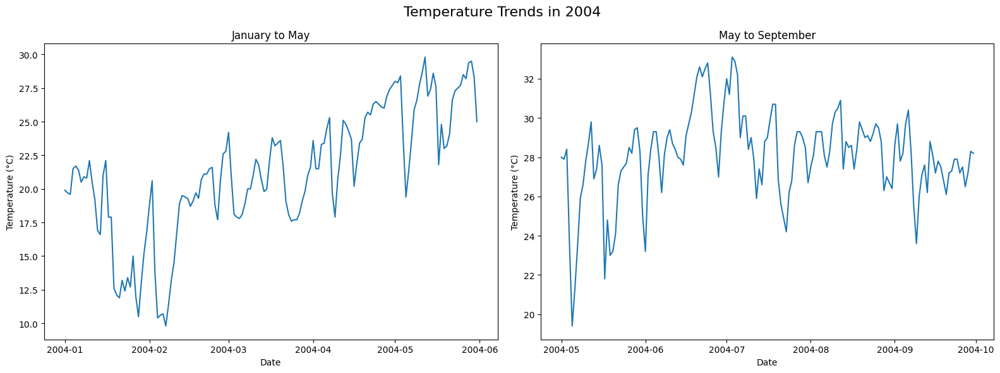

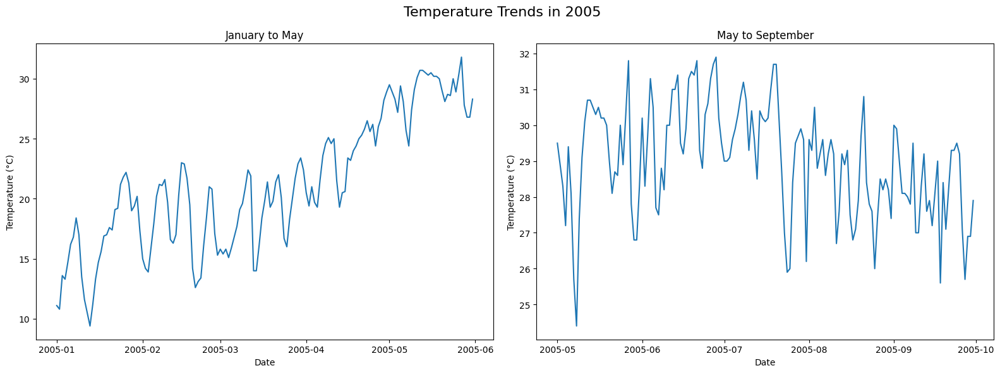

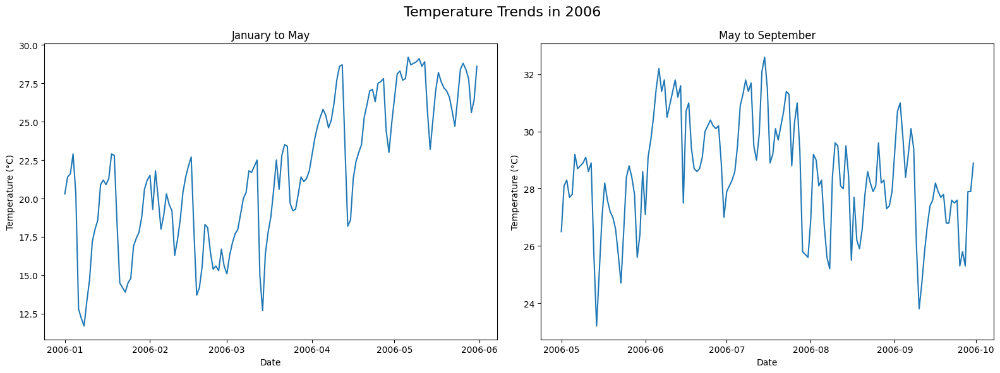

...

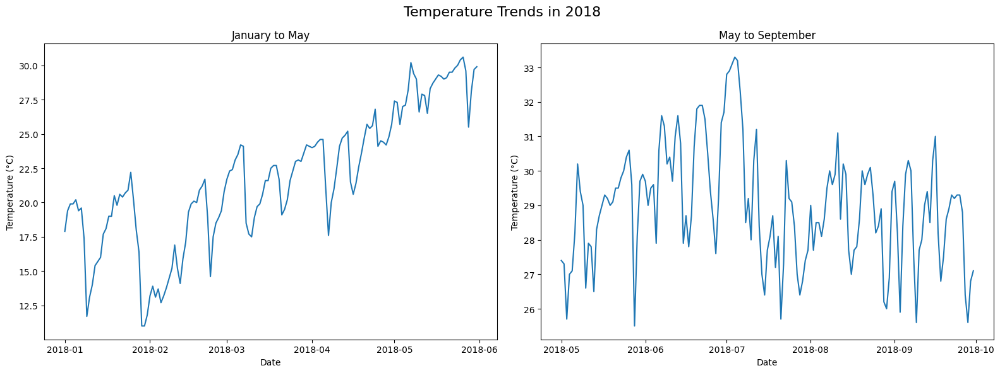

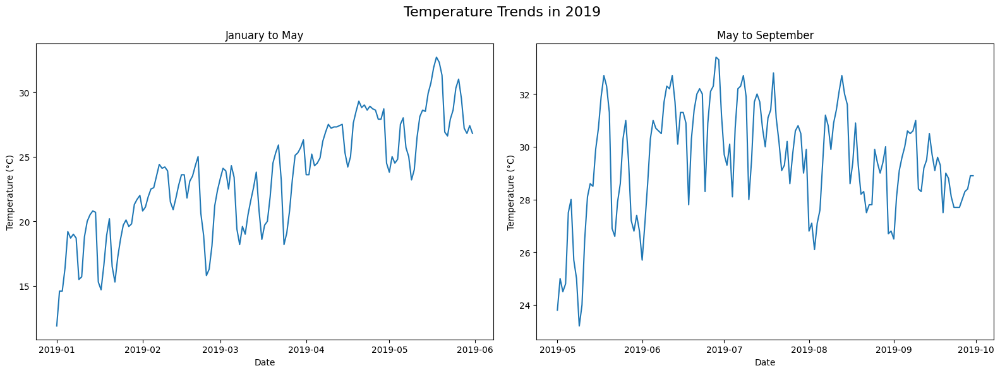

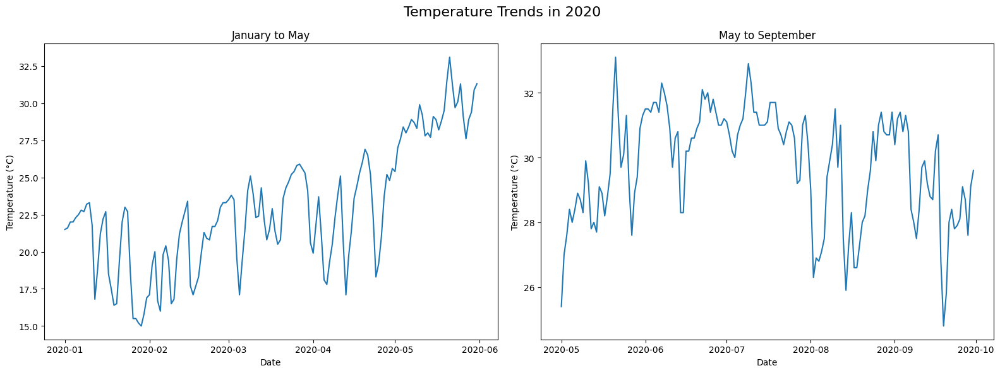

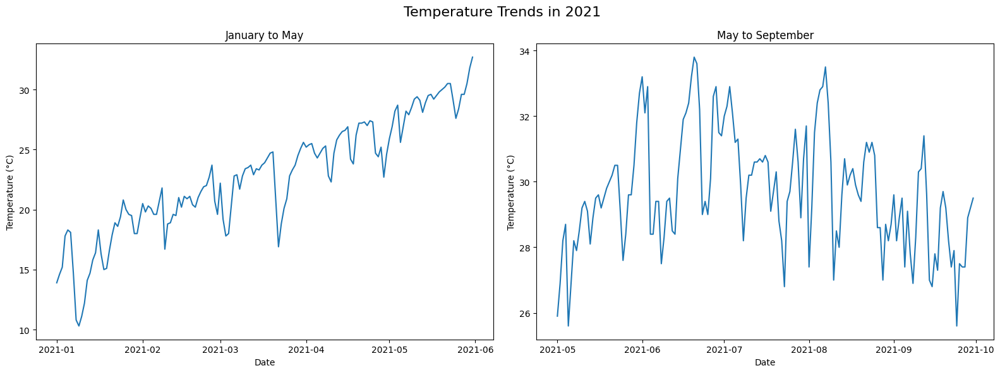

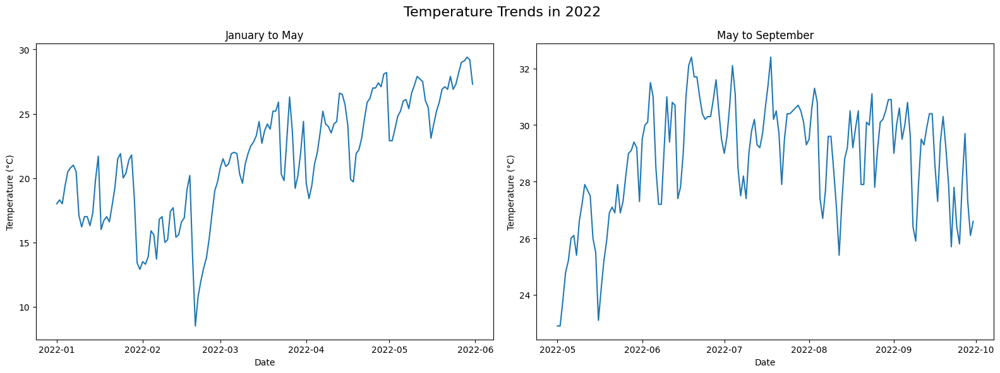

In [9]:
years = weather['year'].unique()

for year in years:
    weather_year = weather[weather['year'] == year]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Temperature Trends in {year}', fontsize=16)
    
    jan_may = weather_year[(weather_year['month']>= 1) & (weather_year['month'] <= 5)]
    sns.lineplot(data=jan_may, x='datetime', y='temp', ax=ax1)
    ax1.set_title('January to May')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Temperature (°C)')
    
    may_sep = weather_year[(weather_year['month'] >= 5) & (weather_year['month'] <= 9)]
    sns.lineplot(data=may_sep, x='datetime', y='temp', ax=ax2)
    ax2.set_title('May to September')
    ax2.set_xlabel('Date')
    ax2.set_ylabel('Temperature (°C)')
    
    plt.tight_layout()
    plt.show()

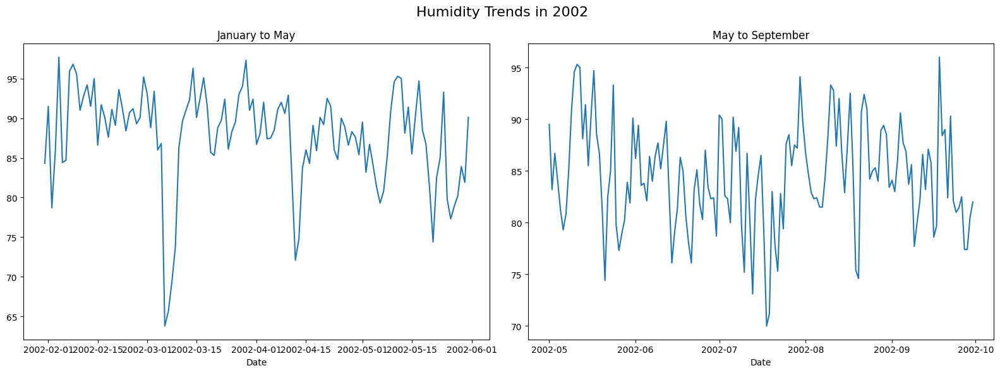

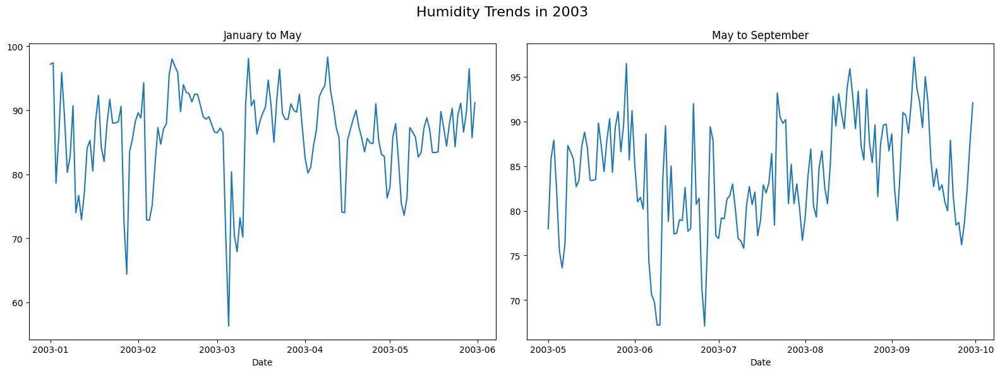

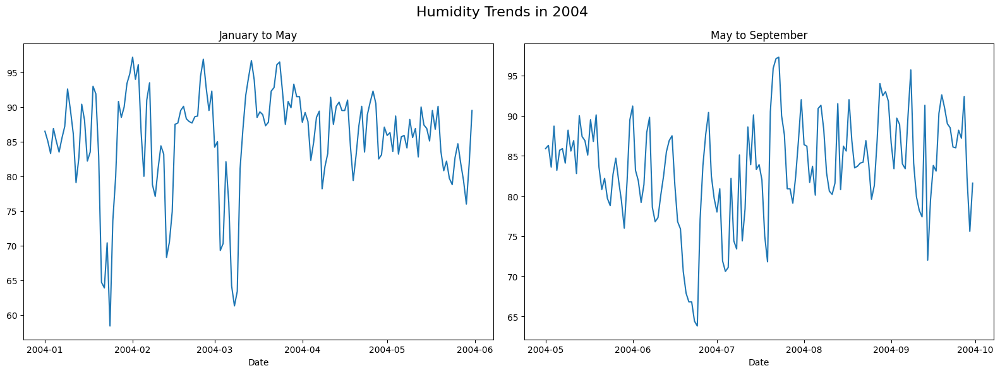

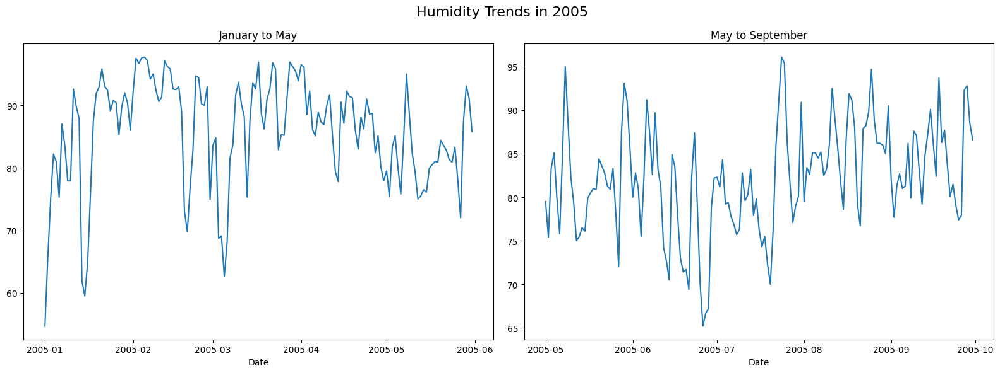

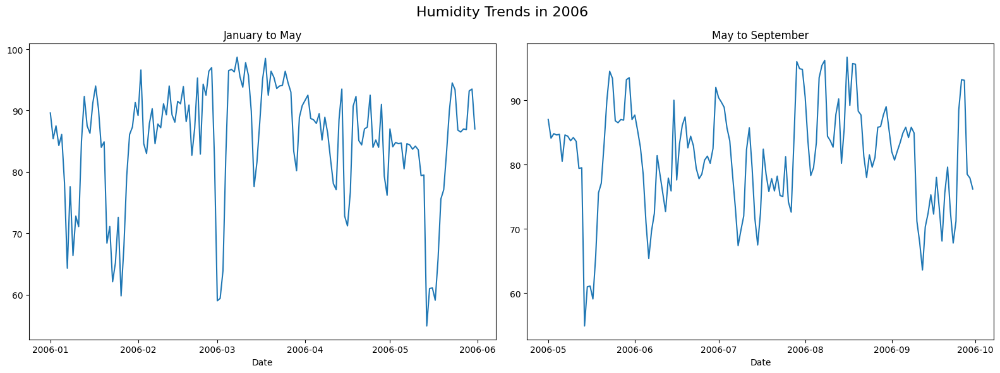

...

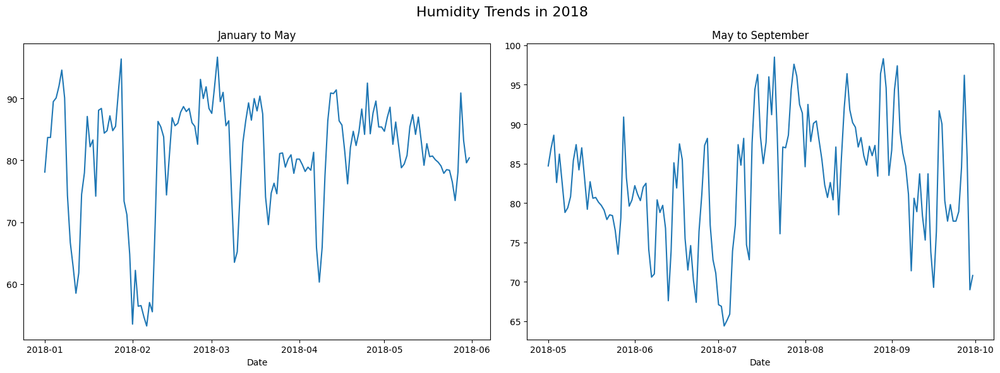

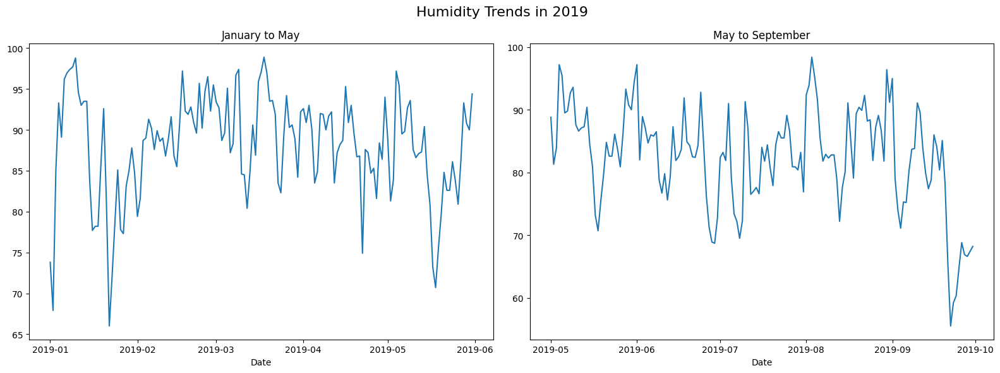

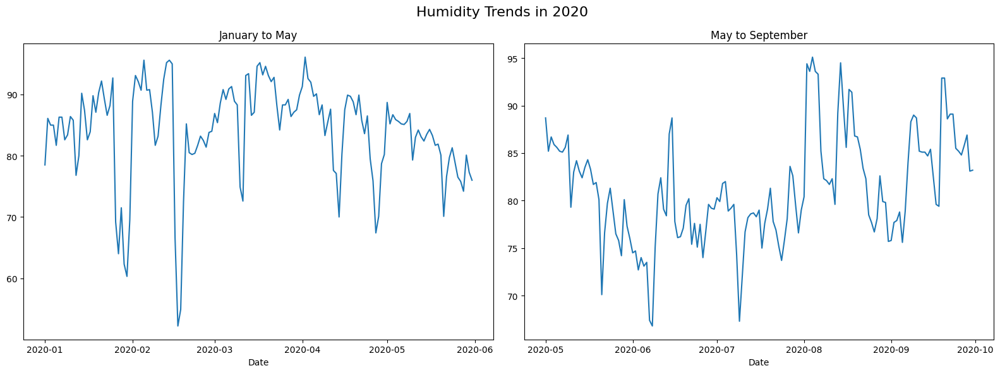

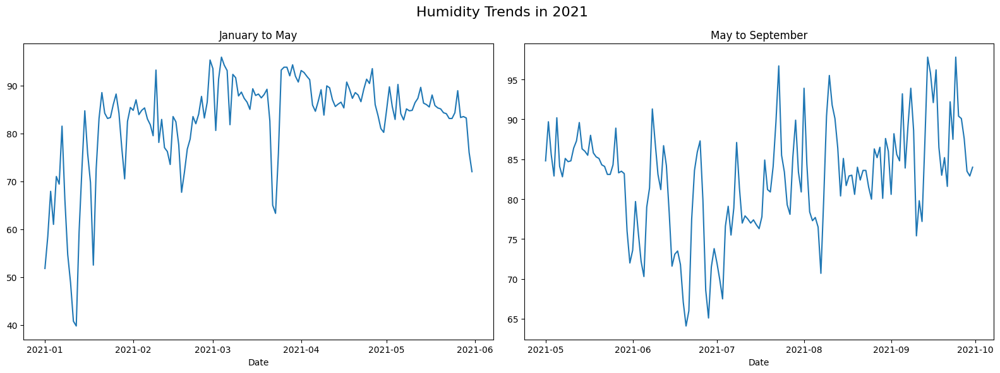

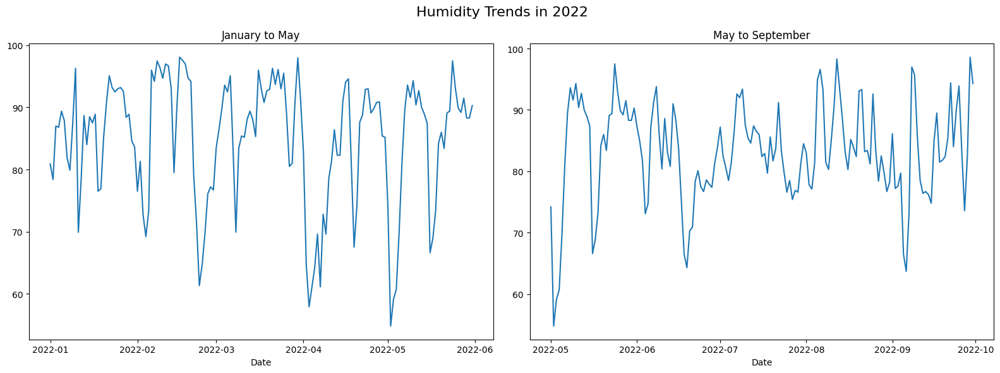

In [26]:
years = weather['year'].unique()

for year in years:
    weather_year = weather[weather['year'] == year]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'Humidity Trends in {year}', fontsize=16)
    
    jan_may = weather_year[(weather_year['month']>= 1) & (weather_year['month'] <= 5)]
    sns.lineplot(data=jan_may, x='datetime', y='humidity', ax=ax1)
    ax1.set_title('January to May')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('')
    
    may_sep = weather_year[(weather_year['month'] >= 5) & (weather_year['month'] <= 9)]
    sns.lineplot(data=may_sep, x='datetime', y='humidity', ax=ax2)
    ax2.set_title('May to September')
    ax2.set_xlabel('Date')
    ax2.set_ylabel('')
    
    plt.tight_layout()
    plt.show()

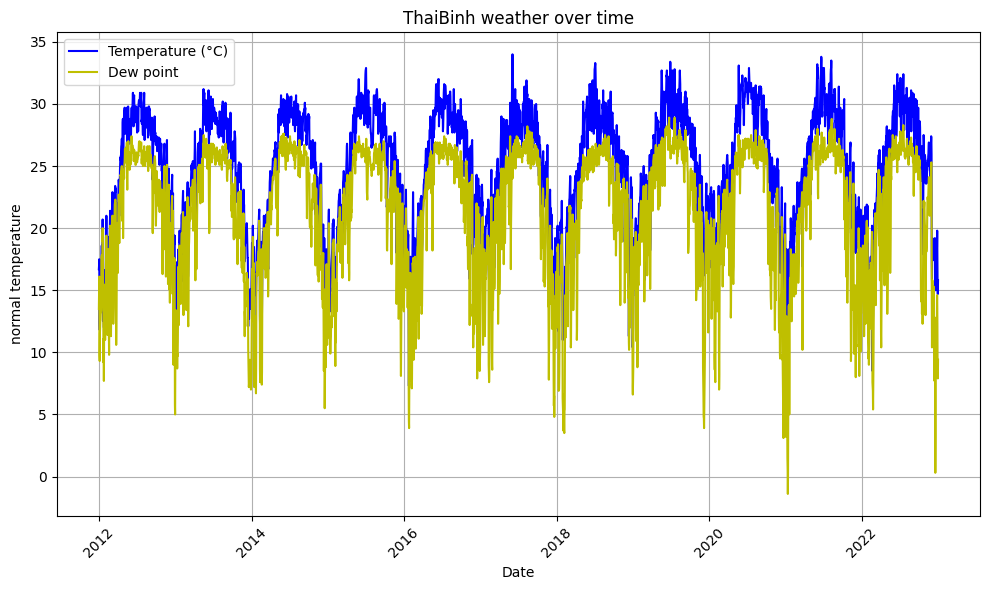

In [14]:
plt.figure(figsize=(10,6))
plt.plot(weather['datetime'], weather['temp'], linestyle='-',color='b',label='Temperature (°C)')
plt.plot(weather['datetime'], weather['dew'], linestyle='-',color='y',label='Dew point')
plt.title('ThaiBinh weather over time')
plt.xlabel('Date')
plt.ylabel('normal temperature')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(loc='upper left')
plt.show()

##### crop

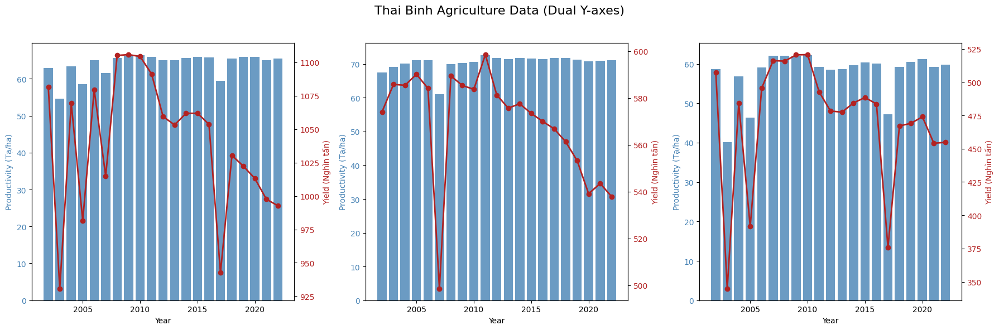

In [24]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Thai Binh Agriculture Data (Dual Y-axes)', fontsize=16)

# Define colors
bar_color = '#4682B4'  # Muted blue
line_color = '#B22222'  # Muted red

# Plot 1: Annual productivity (bar) and yield (line) with dual y-axes
ax1.bar(crop['Năm'], crop['Năng suất cả năm'], label='Productivity (Tạ/ha)', color=bar_color, alpha=0.8)
ax1.set_xlabel('Year')
ax1.set_ylabel('Productivity (Tạ/ha)', color=bar_color)
ax1.tick_params(axis='y', labelcolor=bar_color)

# Create a second y-axis for yield
ax1_2 = ax1.twinx()
ax1_2.plot(crop['Năm'], crop['Sản lượng cả năm'], label='Yield (Nghìn tấn)', marker='o', color=line_color, linewidth=2)
ax1_2.set_ylabel('Yield (Nghìn tấn)', color=line_color)
ax1_2.tick_params(axis='y', labelcolor=line_color)

# Plot 2: Winter-spring productivity (bar) and yield (line) with dual y-axes
ax2.bar(crop['Năm'], crop['Năng suất vụ đông xuân'], label='Productivity (Tạ/ha)', color=bar_color, alpha=0.8)
ax2.set_xlabel('Year')
ax2.set_ylabel('Productivity (Tạ/ha)', color=bar_color)
ax2.tick_params(axis='y', labelcolor=bar_color)

# Create a second y-axis for yield
ax2_2 = ax2.twinx()
ax2_2.plot(crop['Năm'], crop['Sản lượng vụ đông xuân'], label='Yield (Nghìn tấn)', marker='o', color=line_color, linewidth=2)
ax2_2.set_ylabel('Yield (Nghìn tấn)', color=line_color)
ax2_2.tick_params(axis='y', labelcolor=line_color)

# Plot 3: Summer-autumn productivity (bar) and yield (line) with dual y-axes
ax3.bar(crop['Năm'], crop['Năng suất vụ mùa'], label='Productivity (Tạ/ha)', color=bar_color, alpha=0.8)
ax3.set_xlabel('Year')
ax3.set_ylabel('Productivity (Tạ/ha)', color=bar_color)
ax3.tick_params(axis='y', labelcolor=bar_color)

# Create a second y-axis for yield
ax3_2 = ax3.twinx()
ax3_2.plot(crop['Năm'], crop['Sản lượng vụ mùa'], label='Yield (Nghìn tấn)', marker='o', color=line_color, linewidth=2)
ax3_2.set_ylabel('Yield (Nghìn tấn)', color=line_color)
ax3_2.tick_params(axis='y', labelcolor=line_color)

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_39856\2255208680.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  weather['solarenergy'].fillna(weather['solarenergy'].mean(), inplace=True)


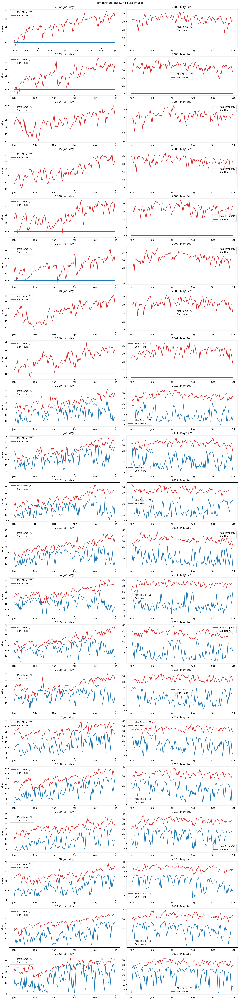

In [8]:
# Convert the 'datetime' column to datetime format
weather['datetime'] = pd.to_datetime(weather['datetime'], format='%m/%d/%Y')

# Extract the year and month for filtering
weather['year'] = weather['datetime'].dt.year
weather['month'] = weather['datetime'].dt.month

# Fill missing solar energy data with the mean value (if needed)
weather['solarenergy'].fillna(weather['solarenergy'].mean(), inplace=True)

# Function to filter data by specific date ranges and plot
def plot_temperature_and_sun_hours(weather):
    years = weather['year'].unique()
    
    # Set up the plotting space with subplots for each year
    n_years = len(years)
    fig, axs = plt.subplots(n_years, 2, figsize=(15, n_years * 3), constrained_layout=True)

    for i, year in enumerate(sorted(years)):
        # Filter data for January to May (months 1-5) and May to September (months 5-9)
        jan_to_may = weather[(weather['year'] == year) & (weather['month'] <= 5)]
        may_to_sept = weather[(weather['year'] == year) & (weather['month'] >= 5) & (weather['month'] <= 9)]

        # Plot temperature and sun hours for Jan-May (first subplot)
        axs[i, 0].plot(jan_to_may['datetime'], jan_to_may['tempmax'], label='Max Temp (°C)', color='tab:red')
        axs[i, 0].plot(jan_to_may['datetime'], jan_to_may['solarenergy'], label='Sun Hours', color='tab:blue')
        axs[i, 0].set_title(f'{year}: Jan-May')
        axs[i, 0].set_ylabel('Value')
        axs[i, 0].xaxis.set_major_formatter(DateFormatter('%b'))
        axs[i, 0].legend()

        # Plot temperature and sun hours for May-Sept (second subplot)
        axs[i, 1].plot(may_to_sept['datetime'], may_to_sept['tempmax'], label='Max Temp (°C)', color='tab:red')
        axs[i, 1].plot(may_to_sept['datetime'], may_to_sept['solarenergy'], label='Sun Hours', color='tab:blue')
        axs[i, 1].set_title(f'{year}: May-Sept')
        axs[i, 1].xaxis.set_major_formatter(DateFormatter('%b'))
        axs[i, 1].legend()

    # Set the overall plot title and display
    plt.suptitle('Temperature and Sun Hours by Year')
    plt.show()

# Call the plotting function with the dataset
plot_temperature_and_sun_hours(weather)


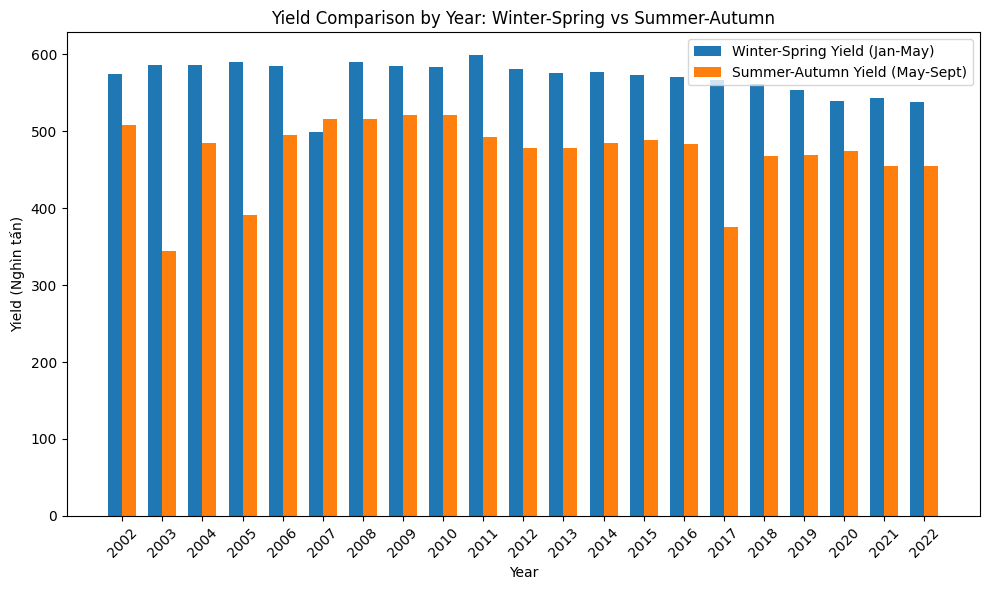

In [9]:
# Extract relevant columns for plotting
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Set the figure size
plt.figure(figsize=(10, 6))

# Create a grouped bar chart
bar_width = 0.35
index = np.arange(len(years))

# Plot Winter-Spring yield
plt.bar(index, winter_spring_yield, bar_width, label='Winter-Spring Yield (Jan-May)', color='tab:blue')

# Plot Summer-Autumn yield
plt.bar(index + bar_width, summer_autumn_yield, bar_width, label='Summer-Autumn Yield (May-Sept)', color='tab:orange')

# Add labels and titles
plt.xlabel('Year')
plt.ylabel('Yield (Nghìn tấn)')
plt.title('Yield Comparison by Year: Winter-Spring vs Summer-Autumn')
plt.xticks(index + bar_width / 2, years, rotation=45)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

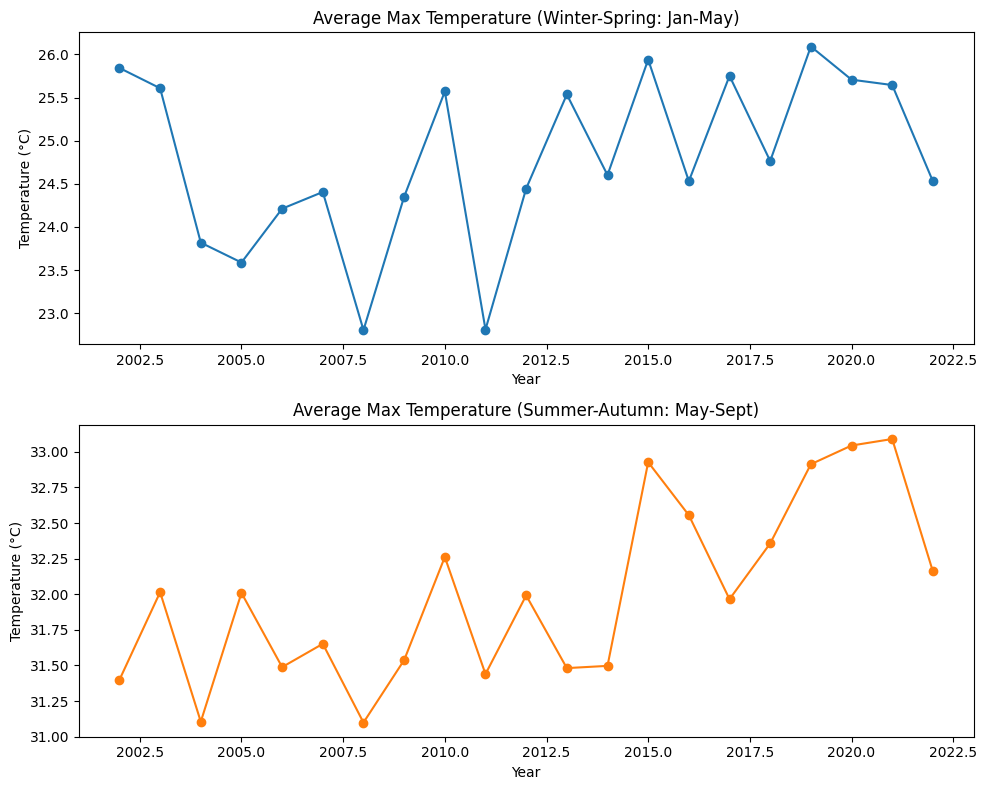

In [10]:
# Convert the 'datetime' column to datetime format
weather['datetime'] = pd.to_datetime(weather['datetime'], format='%m/%d/%Y')

# Extract the year and month
weather['year'] = weather['datetime'].dt.year
weather['month'] = weather['datetime'].dt.month

# Filter data for January to May (Winter-Spring) and May to September (Summer-Autumn)
winter_spring = weather[weather['month'] <= 5]
summer_autumn = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Group by year and calculate the average max temperature for both periods
winter_spring_avg = winter_spring.groupby('year')['tempmax'].mean()
summer_autumn_avg = summer_autumn.groupby('year')['tempmax'].mean()

# Set up subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 8))

# Plot Winter-Spring (January-May) average max temperature
axs[0].plot(winter_spring_avg.index, winter_spring_avg.values, marker='o', color='tab:blue')
axs[0].set_title('Average Max Temperature (Winter-Spring: Jan-May)')
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Temperature (°C)')

# Plot Summer-Autumn (May-September) average max temperature
axs[1].plot(summer_autumn_avg.index, summer_autumn_avg.values, marker='o', color='tab:orange')
axs[1].set_title('Average Max Temperature (Summer-Autumn: May-Sept)')
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Temperature (°C)')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

##### Avg Max Temp vs Rice Yield

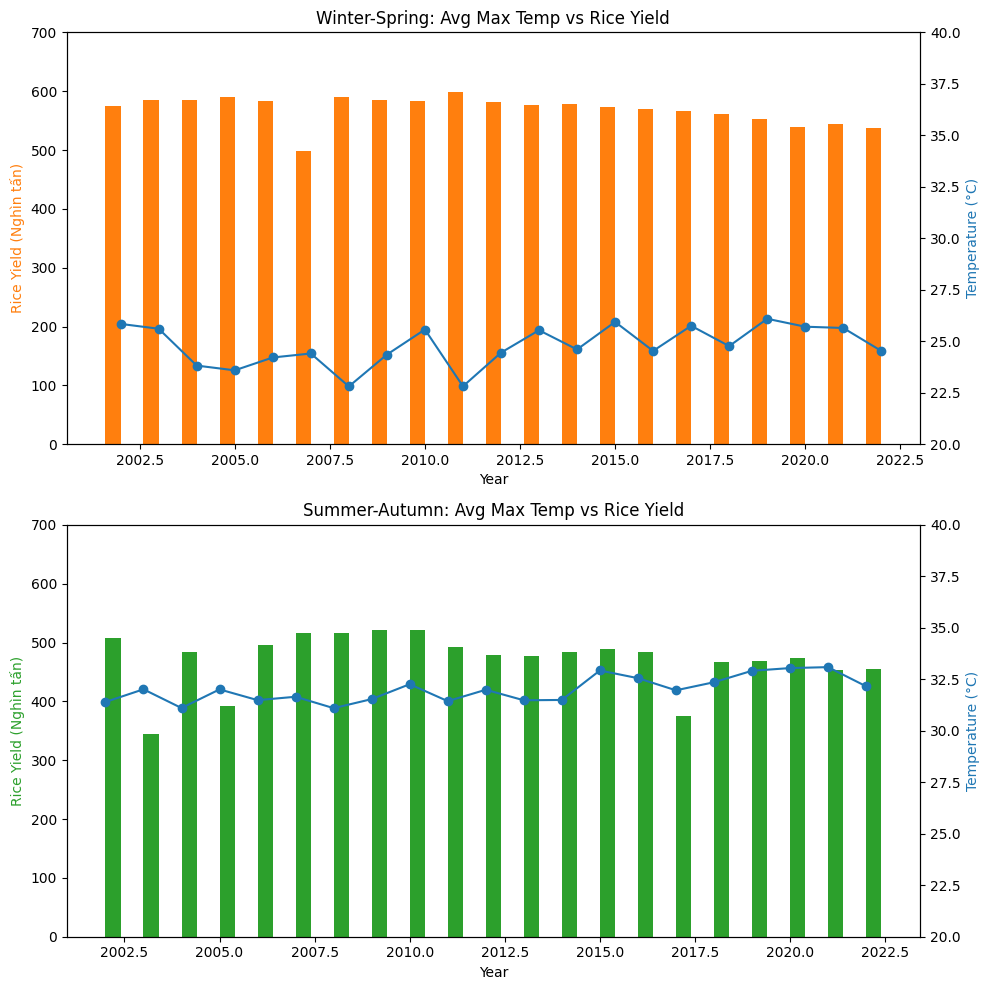

In [17]:
# Filter temperature data for Winter-Spring (Jan-May) and Summer-Autumn (May-Sept)
winter_spring_temp = weather[weather['month'] <= 5]
summer_autumn_temp = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Calculate the average max temperature by year for both periods
winter_spring_avg_temp = winter_spring_temp.groupby('year')['tempmax'].mean()
summer_autumn_avg_temp = summer_autumn_temp.groupby('year')['tempmax'].mean()

# Extract rice yield data (assume crop has columns: 'Năm', 'Sản lượng vụ đông xuân', 'Sản lượng vụ mùa')
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Create the subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot Winter-Spring data (Jan-May)
ax1 = axs[0]
ax2 = ax1.twinx()  # Create a twin axis to overlay the rice yield
ax1.bar(years - 0.2, winter_spring_yield, width=0.4, label='Winter-Spring Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.plot(winter_spring_avg_temp.index, winter_spring_avg_temp.values, label='Avg Max Temp (°C)', color='tab:blue', marker='o')

# Set proper labels and limits for temperature and yield
ax1.set_xlabel('Year')
ax1.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.set_ylabel('Temperature (°C)', color='tab:blue')
ax1.set_ylim([0, 700])  # Set the range for rice yield
ax2.set_ylim([20, 40])  # Set a reasonable range for temperature
ax2.set_title('Winter-Spring: Avg Max Temp vs Rice Yield')

# Plot Summer-Autumn data (May-Sept)
ax3 = axs[1]
ax4 = ax3.twinx()  # Create a twin axis to overlay the rice yield
ax3.bar(years + 0.2, summer_autumn_yield, width=0.4, label='Summer-Autumn Rice Yield (Nghìn tấn)', color='tab:green')
ax4.plot(summer_autumn_avg_temp.index, summer_autumn_avg_temp.values, label='Avg Max Temp (°C)', color='tab:blue', marker='o')

# Set proper labels and limits for temperature and yield
ax3.set_xlabel('Year')
ax3.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:green')
ax4.set_ylabel('Temperature (°C)', color='tab:blue')
ax3.set_ylim([0, 700])  # Set the range for rice yield
ax4.set_ylim([20, 40])  # Set a reasonable range for temperature
ax4.set_title('Summer-Autumn: Avg Max Temp vs Rice Yield')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

##### Sunshine Energy/Sunshine Hours vs Rice Yield

Sunshine Energy

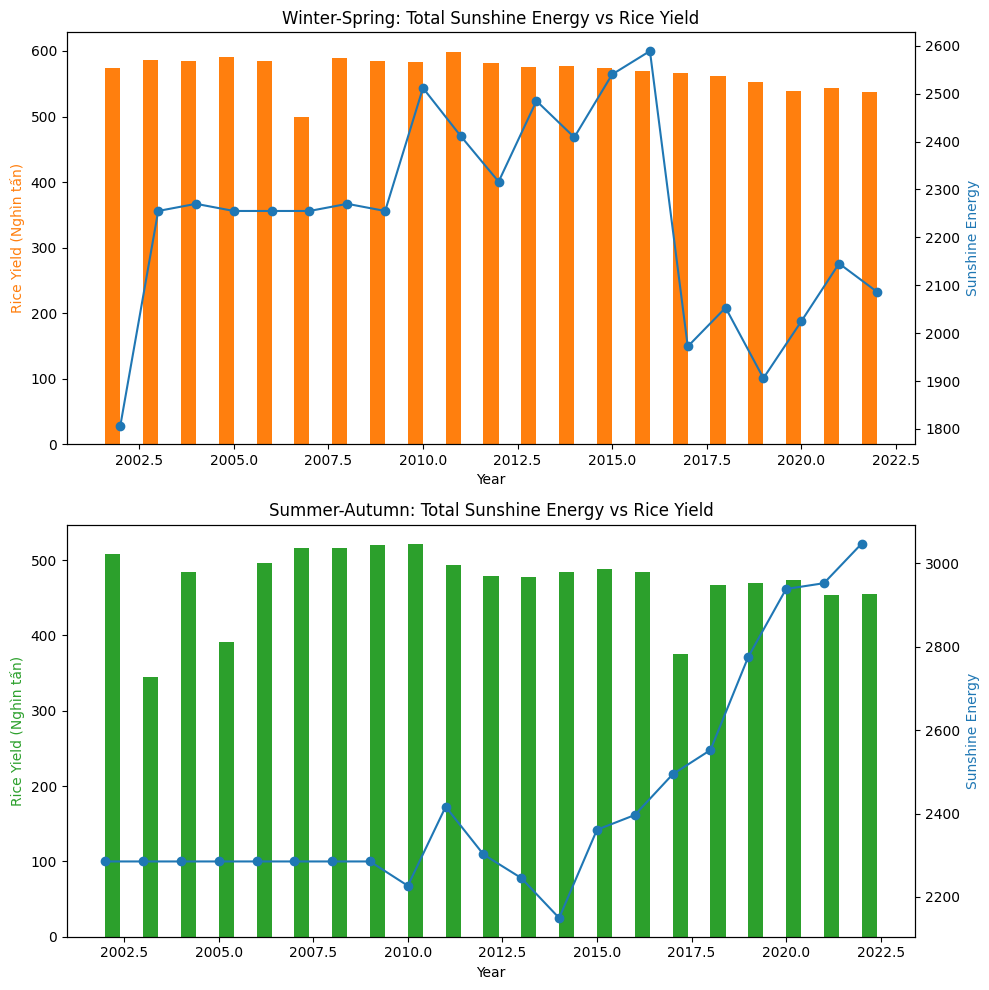

In [32]:
# Convert the 'datetime' column in the temperature data to datetime format
weather['datetime'] = pd.to_datetime(weather['datetime'], format='%m/%d/%Y')
weather['year'] = weather['datetime'].dt.year
weather['month'] = weather['datetime'].dt.month

# Filter sunlight hours data for Winter-Spring (Jan-May) and Summer-Autumn (May-Sept)
winter_spring_sun = weather[weather['month'] <= 5]
summer_autumn_sun = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Calculate total sunlight hours by year for both periods
winter_spring_total_sun = winter_spring_sun.groupby('year')['solarenergy'].sum()
summer_autumn_total_sun = summer_autumn_sun.groupby('year')['solarenergy'].sum()

# Extract rice yield data (assume crop has columns: 'Năm', 'Sản lượng vụ đông xuân', 'Sản lượng vụ mùa')
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Create the subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot Winter-Spring data (Jan-May)
ax1 = axs[0]
ax2 = ax1.twinx()  # Create a twin axis to overlay the rice yield
ax1.bar(years - 0.2, winter_spring_yield, width=0.4, label='Winter-Spring Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.plot(winter_spring_total_sun.index, winter_spring_total_sun.values, label='Total Sunshine Hours', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax1.set_xlabel('Year')
ax2.set_ylabel('Sunshine Energy', color='tab:blue')
ax1.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:orange')
ax1.set_title('Winter-Spring: Total Sunshine Energy vs Rice Yield')

# Plot Summer-Autumn data (May-Sept)
ax3 = axs[1]
ax4 = ax3.twinx()  # Create a twin axis to overlay the rice yield
ax3.bar(years + 0.2, summer_autumn_yield, width=0.4, label='Summer-Autumn Rice Yield (Nghìn tấn)', color='tab:green')
ax4.plot(summer_autumn_total_sun.index, summer_autumn_total_sun.values, label='Total Sunshine Hours', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax3.set_xlabel('Year')
ax4.set_ylabel('Sunshine Energy', color='tab:blue')
ax3.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:green')
ax3.set_title('Summer-Autumn: Total Sunshine Energy vs Rice Yield')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


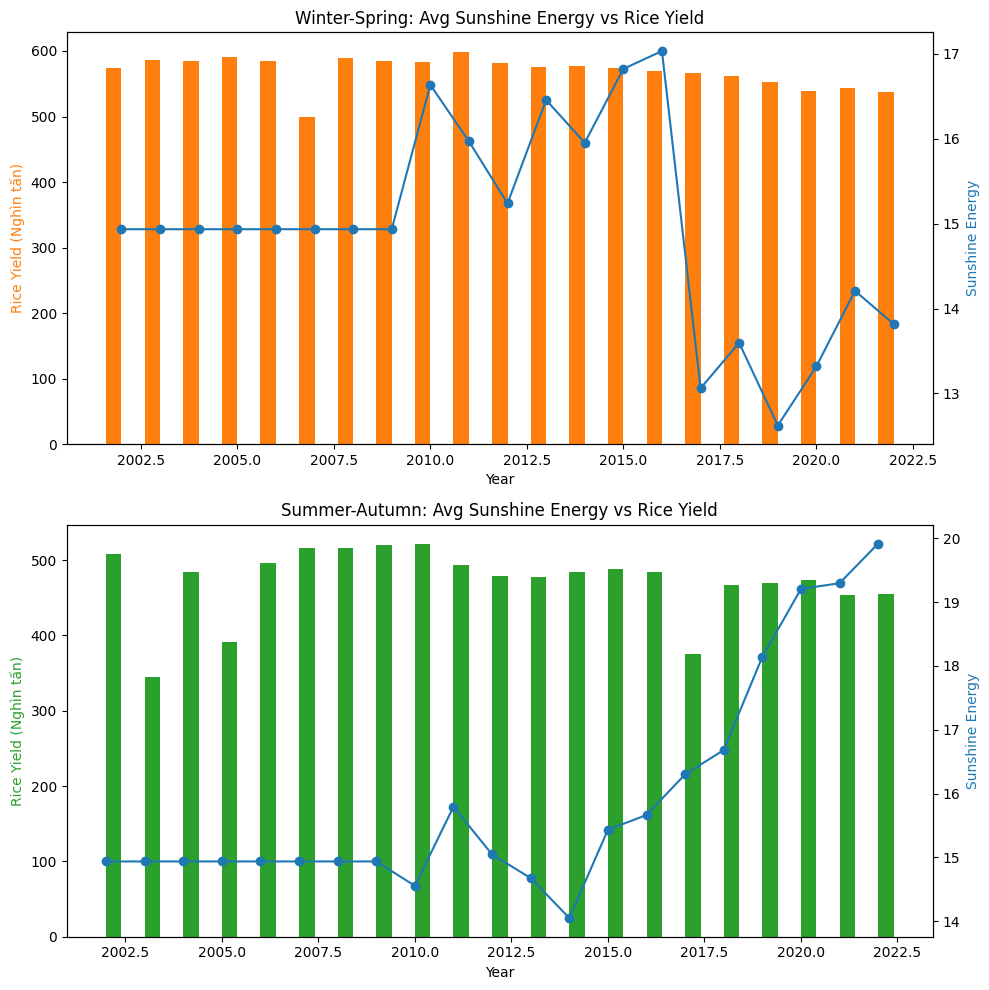

In [34]:
# Convert the 'datetime' column in the temperature data to datetime format
weather['datetime'] = pd.to_datetime(weather['datetime'], format='%m/%d/%Y')
weather['year'] = weather['datetime'].dt.year
weather['month'] = weather['datetime'].dt.month

# Filter sunlight hours data for Winter-Spring (Jan-May) and Summer-Autumn (May-Sept)
winter_spring_sun = weather[weather['month'] <= 5]
summer_autumn_sun = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Calculate total sunlight hours by year for both periods
winter_spring_total_sun = winter_spring_sun.groupby('year')['solarenergy'].mean()
summer_autumn_total_sun = summer_autumn_sun.groupby('year')['solarenergy'].mean()

# Extract rice yield data (assume crop has columns: 'Năm', 'Sản lượng vụ đông xuân', 'Sản lượng vụ mùa')
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Create the subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot Winter-Spring data (Jan-May)
ax1 = axs[0]
ax2 = ax1.twinx()  # Create a twin axis to overlay the rice yield
ax1.bar(years - 0.2, winter_spring_yield, width=0.4, label='Winter-Spring Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.plot(winter_spring_total_sun.index, winter_spring_total_sun.values, label='Avg Sunshine Hours', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax1.set_xlabel('Year')
ax2.set_ylabel('Sunshine Energy', color='tab:blue')
ax1.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:orange')
ax1.set_title('Winter-Spring: Avg Sunshine Energy vs Rice Yield')

# Plot Summer-Autumn data (May-Sept)
ax3 = axs[1]
ax4 = ax3.twinx()  # Create a twin axis to overlay the rice yield
ax3.bar(years + 0.2, summer_autumn_yield, width=0.4, label='Summer-Autumn Rice Yield (Nghìn tấn)', color='tab:green')
ax4.plot(summer_autumn_total_sun.index, summer_autumn_total_sun.values, label='Avg Sunshine Hours', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax3.set_xlabel('Year')
ax4.set_ylabel('Sunshine Energy', color='tab:blue')
ax3.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:green')
ax3.set_title('Summer-Autumn: Avg Sunshine Energy vs Rice Yield')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


Sunshine Hours

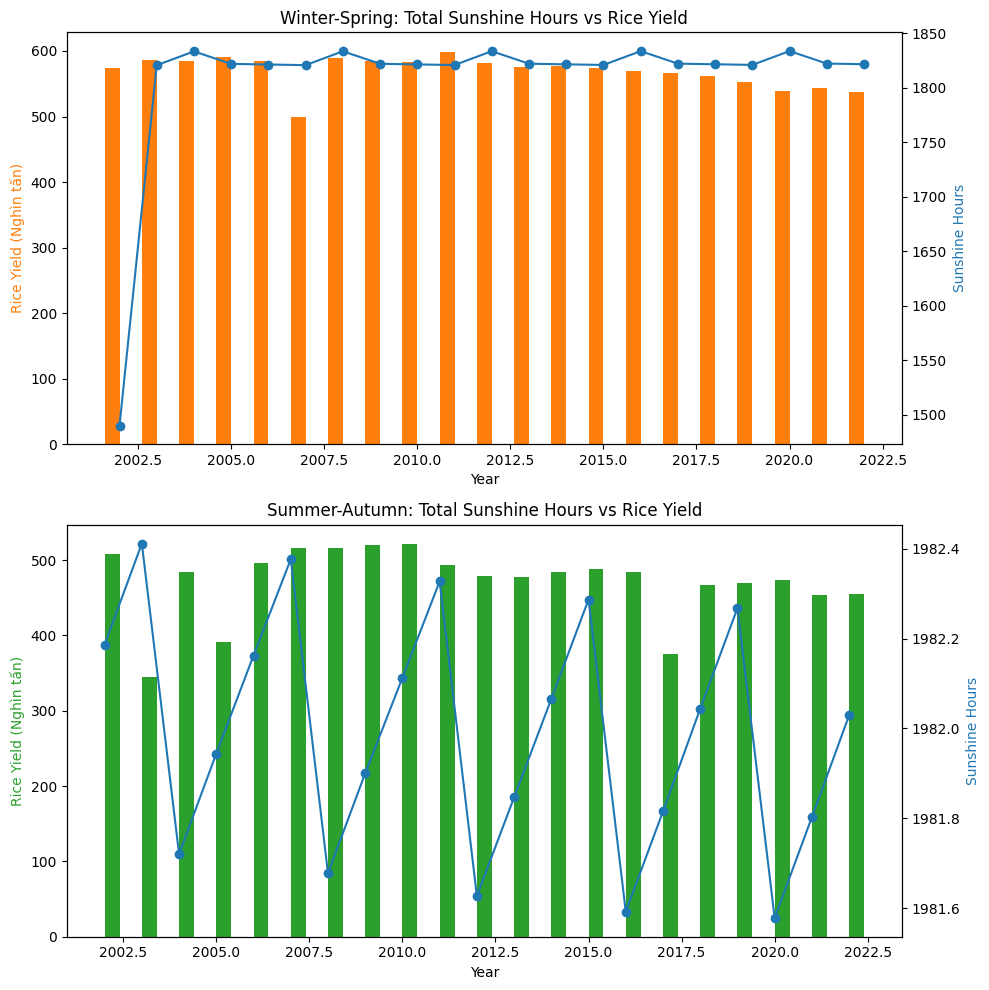

In [31]:
# Ensure 'sunrise' and 'sunset' are in datetime format (including date)
weather['sunrise'] = pd.to_datetime(weather['sunrise'])
weather['sunset'] = pd.to_datetime(weather['sunset'])

# Calculate sunlight hours (difference between sunset and sunrise)
weather['sunlight_hours'] = (weather['sunset'] - weather['sunrise']).dt.total_seconds() / 3600

# Filter data for Winter-Spring (Jan-May) and Summer-Autumn (May-Sept)
winter_spring_sun = weather[weather['month'] <= 5]
summer_autumn_sun = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Calculate total sunlight hours by year for both periods
winter_spring_total_sun = winter_spring_sun.groupby('year')['sunlight_hours'].sum()
summer_autumn_total_sun = summer_autumn_sun.groupby('year')['sunlight_hours'].sum()

# Load rice yield data (replace with actual columns in your dataset)
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Create the subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot Winter-Spring data (Jan-May)
ax1 = axs[0]
ax2 = ax1.twinx()  # Create a twin axis to overlay the rice yield
ax1.bar(years - 0.2, winter_spring_yield, width=0.4, label='Winter-Spring Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.plot(winter_spring_total_sun.index, winter_spring_total_sun.values, label='Total Sunshine Hours', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax1.set_xlabel('Year')
ax2.set_ylabel('Sunshine Hours', color='tab:blue')
ax1.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:orange')
ax1.set_title('Winter-Spring: Total Sunshine Hours vs Rice Yield')

# Plot Summer-Autumn data (May-Sept)
ax3 = axs[1]
ax4 = ax3.twinx()  # Create a twin axis to overlay the rice yield
ax4.plot(summer_autumn_total_sun.index, summer_autumn_total_sun.values, label='Total Sunshine Hours', color='tab:blue', marker='o')
ax3.bar(years + 0.2, summer_autumn_yield, width=0.4, label='Summer-Autumn Rice Yield (Nghìn tấn)', color='tab:green')

# Set proper labels and limits for sunlight hours and rice yield
ax3.set_xlabel('Year')
ax4.set_ylabel('Sunshine Hours', color='tab:blue')
ax3.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:green')
ax3.set_title('Summer-Autumn: Total Sunshine Hours vs Rice Yield')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


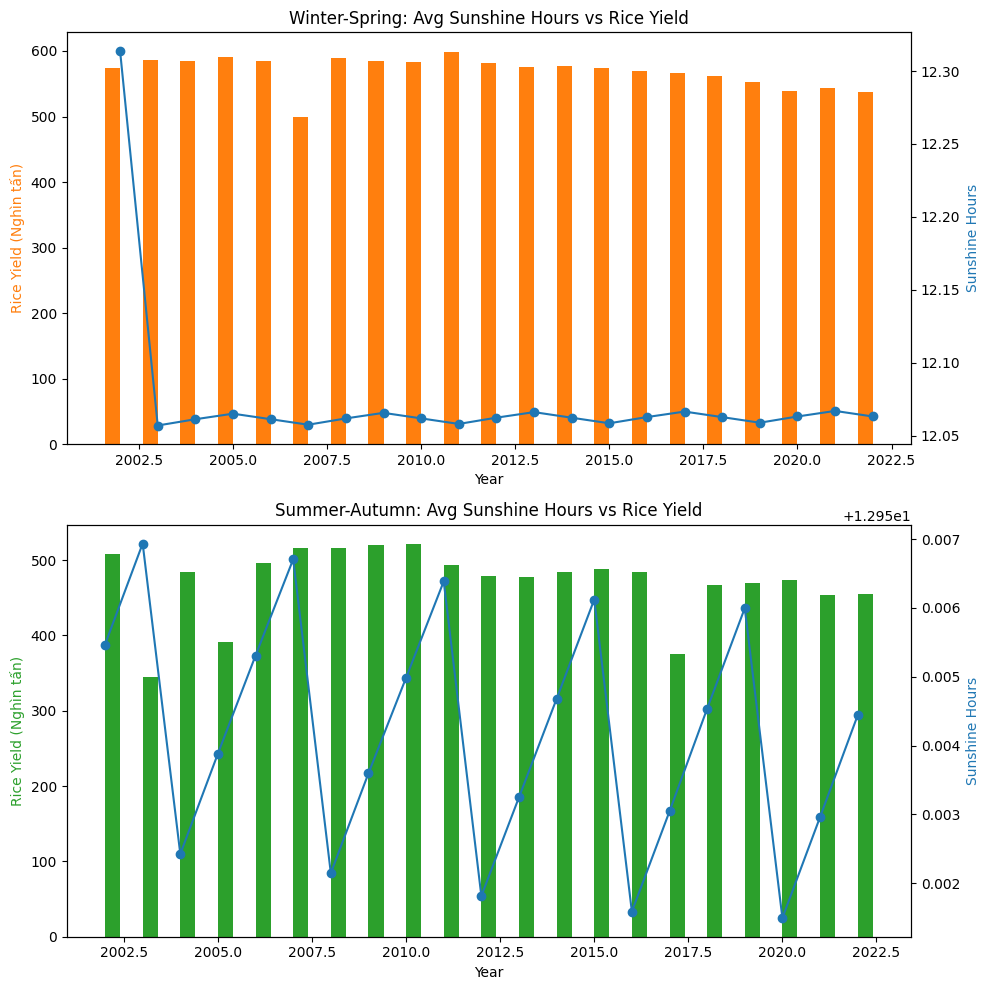

In [35]:
# Ensure 'sunrise' and 'sunset' are in datetime format (including date)
weather['sunrise'] = pd.to_datetime(weather['sunrise'])
weather['sunset'] = pd.to_datetime(weather['sunset'])

# Calculate sunlight hours (difference between sunset and sunrise)
weather['sunlight_hours'] = (weather['sunset'] - weather['sunrise']).dt.total_seconds() / 3600

# Filter data for Winter-Spring (Jan-May) and Summer-Autumn (May-Sept)
winter_spring_sun = weather[weather['month'] <= 5]
summer_autumn_sun = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Calculate total sunlight hours by year for both periods
winter_spring_total_sun = winter_spring_sun.groupby('year')['sunlight_hours'].mean()
summer_autumn_total_sun = summer_autumn_sun.groupby('year')['sunlight_hours'].mean()

# Load rice yield data (replace with actual columns in your dataset)
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Create the subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot Winter-Spring data (Jan-May)
ax1 = axs[0]
ax2 = ax1.twinx()  # Create a twin axis to overlay the rice yield
ax1.bar(years - 0.2, winter_spring_yield, width=0.4, label='Winter-Spring Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.plot(winter_spring_total_sun.index, winter_spring_total_sun.values, label='Avg Sunshine Hours', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax1.set_xlabel('Year')
ax2.set_ylabel('Sunshine Hours', color='tab:blue')
ax1.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:orange')
ax1.set_title('Winter-Spring: Avg Sunshine Hours vs Rice Yield')

# Plot Summer-Autumn data (May-Sept)
ax3 = axs[1]
ax4 = ax3.twinx()  # Create a twin axis to overlay the rice yield
ax4.plot(summer_autumn_total_sun.index, summer_autumn_total_sun.values, label='Avg Sunshine Hours', color='tab:blue', marker='o')
ax3.bar(years + 0.2, summer_autumn_yield, width=0.4, label='Summer-Autumn Rice Yield (Nghìn tấn)', color='tab:green')

# Set proper labels and limits for sunlight hours and rice yield
ax3.set_xlabel('Year')
ax4.set_ylabel('Sunshine Hours', color='tab:blue')
ax3.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:green')
ax3.set_title('Summer-Autumn: Avg Sunshine Hours vs Rice Yield')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

##### Humidity vs Rice Yield

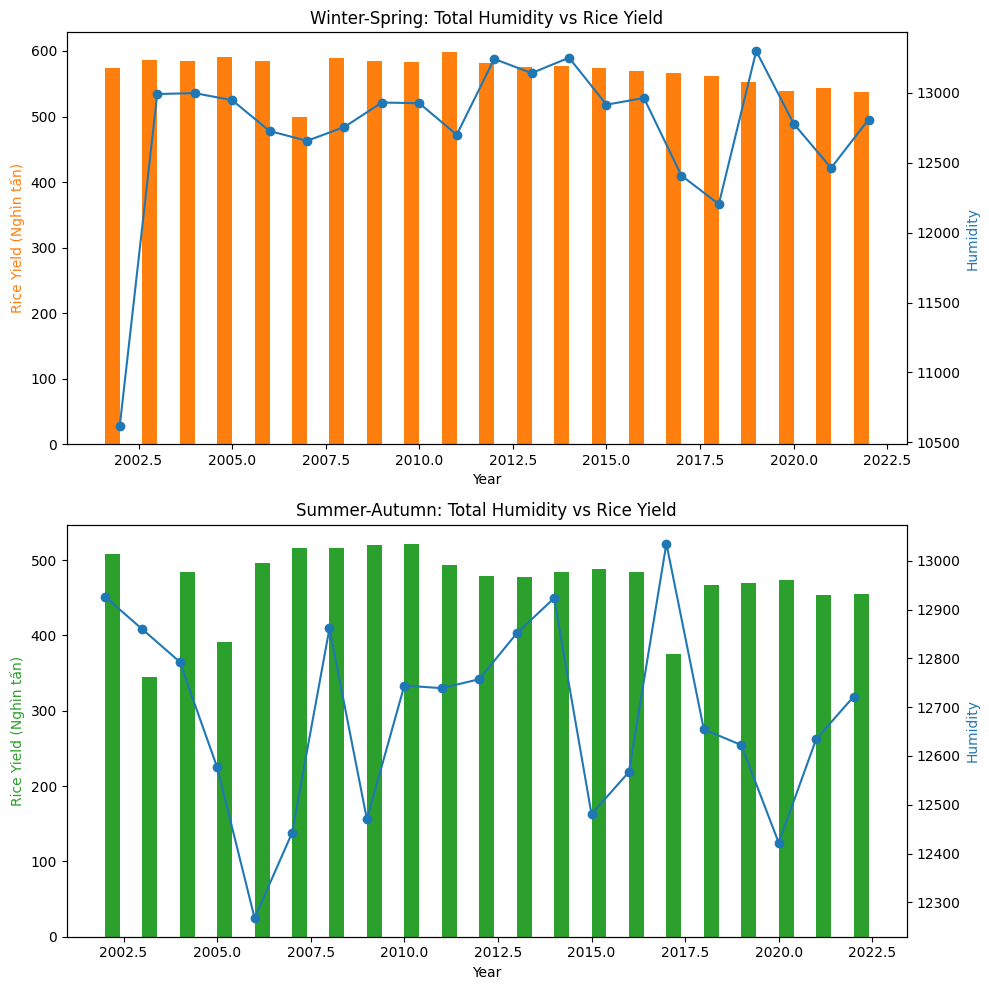

In [33]:
# Convert the 'datetime' column in the temperature data to datetime format
weather['datetime'] = pd.to_datetime(weather['datetime'], format='%m/%d/%Y')
weather['year'] = weather['datetime'].dt.year
weather['month'] = weather['datetime'].dt.month

# Filter sunlight hours data for Winter-Spring (Jan-May) and Summer-Autumn (May-Sept)
winter_spring_sun = weather[weather['month'] <= 5]
summer_autumn_sun = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Calculate total sunlight hours by year for both periods
winter_spring_total_sun = winter_spring_sun.groupby('year')['humidity'].sum()
summer_autumn_total_sun = summer_autumn_sun.groupby('year')['humidity'].sum()

# Extract rice yield data (assume crop has columns: 'Năm', 'Sản lượng vụ đông xuân', 'Sản lượng vụ mùa')
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Create the subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot Winter-Spring data (Jan-May)
ax1 = axs[0]
ax2 = ax1.twinx()  # Create a twin axis to overlay the rice yield
ax1.bar(years - 0.2, winter_spring_yield, width=0.4, label='Winter-Spring Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.plot(winter_spring_total_sun.index, winter_spring_total_sun.values, label='Total Humidity', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax1.set_xlabel('Year')
ax2.set_ylabel('Humidity', color='tab:blue')
ax1.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:orange')
ax1.set_title('Winter-Spring: Total Humidity vs Rice Yield')

# Plot Summer-Autumn data (May-Sept)
ax3 = axs[1]
ax4 = ax3.twinx()  # Create a twin axis to overlay the rice yield
ax3.bar(years + 0.2, summer_autumn_yield, width=0.4, label='Summer-Autumn Rice Yield (Nghìn tấn)', color='tab:green')
ax4.plot(summer_autumn_total_sun.index, summer_autumn_total_sun.values, label='Total Humidity', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax3.set_xlabel('Year')
ax4.set_ylabel('Humidity', color='tab:blue')
ax3.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:green')
ax3.set_title('Summer-Autumn: Total Humidity vs Rice Yield')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

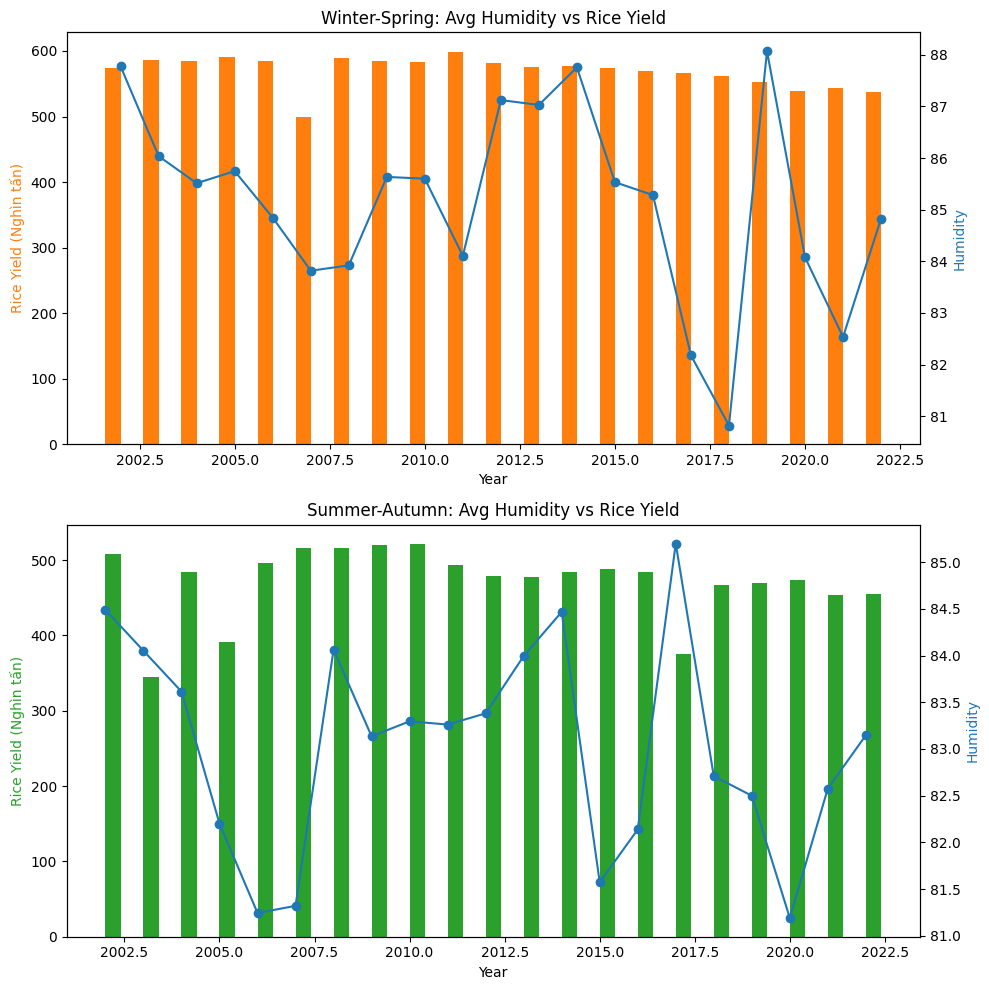

In [37]:
# Convert the 'datetime' column in the temperature data to datetime format
weather['datetime'] = pd.to_datetime(weather['datetime'], format='%m/%d/%Y')
weather['year'] = weather['datetime'].dt.year
weather['month'] = weather['datetime'].dt.month

# Filter sunlight hours data for Winter-Spring (Jan-May) and Summer-Autumn (May-Sept)
winter_spring_sun = weather[weather['month'] <= 5]
summer_autumn_sun = weather[(weather['month'] >= 5) & (weather['month'] <= 9)]

# Calculate total sunlight hours by year for both periods
winter_spring_total_sun = winter_spring_sun.groupby('year')['humidity'].mean()
summer_autumn_total_sun = summer_autumn_sun.groupby('year')['humidity'].mean()

# Extract rice yield data (assume crop has columns: 'Năm', 'Sản lượng vụ đông xuân', 'Sản lượng vụ mùa')
years = crop['Năm']
winter_spring_yield = crop['Sản lượng vụ đông xuân']
summer_autumn_yield = crop['Sản lượng vụ mùa']

# Create the subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot Winter-Spring data (Jan-May)
ax1 = axs[0]
ax2 = ax1.twinx()  # Create a twin axis to overlay the rice yield
ax1.bar(years - 0.2, winter_spring_yield, width=0.4, label='Winter-Spring Rice Yield (Nghìn tấn)', color='tab:orange')
ax2.plot(winter_spring_total_sun.index, winter_spring_total_sun.values, label='Avg Humidity', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax1.set_xlabel('Year')
ax2.set_ylabel('Humidity', color='tab:blue')
ax1.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:orange')
ax1.set_title('Winter-Spring: Avg Humidity vs Rice Yield')

# Plot Summer-Autumn data (May-Sept)
ax3 = axs[1]
ax4 = ax3.twinx()  # Create a twin axis to overlay the rice yield
ax3.bar(years + 0.2, summer_autumn_yield, width=0.4, label='Summer-Autumn Rice Yield (Nghìn tấn)', color='tab:green')
ax4.plot(summer_autumn_total_sun.index, summer_autumn_total_sun.values, label='Avg Humidity', color='tab:blue', marker='o')

# Set proper labels and limits for sunlight hours and rice yield
ax3.set_xlabel('Year')
ax4.set_ylabel('Humidity', color='tab:blue')
ax3.set_ylabel('Rice Yield (Nghìn tấn)', color='tab:green')
ax3.set_title('Summer-Autumn: Avg Humidity vs Rice Yield')

# Adjust layout and show plot
plt.tight_layout()
plt.show()